# Final Group Project - New York Airbnb Analytics

Students:  
- Eunice Worifah
- Fandi Yi
- Pascal Nguyen-Tang 
- Shivangi Soni
- Vivek Saahil

#  Framing the Problem

Airbnb operates an online marketplace for lodging, primarily homestays for vacation rentals, and tourism activities. It allows people (hosts) to list their propoerties for short-term rentals and earns money through the commission for each booking. The business model is based on the idea that these rentals are cheaper than hotels, making the company a threat to hotel industry. The value proposition to hosts is side income, while for the guests it is cheaper accomodation.

The market of these short-term rentals in cities such as New York is highly competitive because renters are presented with a broad range of selection of listings for their specific criteria. Since Airbnb is a marketplace, the dynamics of marketplace have a huge influence on the the amount a host can charge on a nightly basis. This is in fact one of the biggest challenges for the hosts: deciding the prices for their listing. If they charge above the market place, they will lose out on revenue as the renters will most liklely find another affordable alternatives. If the price is set too low, then they again lose out on profits. Additionally, renters may lose out on the opprtunity to live at a great place.

For this project, our goal is build a regression model that can accurately predict the price of the listing, which will:  
1) Help existing hosts adjusts their prices  
2) New hosts decide on a price

Additionally, the machine learning algorithms will provide insight into what factors influence the pricing of these rentals. If they are something that can be controlled by the hosts, then they can use the insights from this analysis to improve those factors and provide better accomodation to guests. For the scope of this project, we will only be looking at properties in New York considering that New York is a highly competitive marketplace for Airbnb. We will also be seeking to answer the following hypotheses by performing Causal ML:       

1) Does the 'Starbucks Effect' affect the price of Airbnb listings?  
2) Does the distance to the nearest metro station affect the price of Airbnb listings?

Link to the dataset:http://insideairbnb.com/get-the-data.html



# #Setup
**IMPORT PACKAGES**

In [35]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import numpy as np
import os

#Pandas Profiling
#!pip install pandas_profiling
import pandas_profiling

# To plot pretty figures
#!pip install -U seaborn
import seaborn as sns
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Ignore useless warnings (see SciPy issue #5998)
import warnings
import gc
warnings.simplefilter(action='ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)
%matplotlib inline

#Display multiple outputs per cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"


# 1) Data Acquisition

**IMPORT DATA**

In [36]:
import pandas as pd
df1=pd.read_csv('http://data.insideairbnb.com/united-states/ny/new-york-city/2021-02-04/data/listings.csv.gz')

In [3]:
df1.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2595,https://www.airbnb.com/rooms/2595,20210204180331,2021-02-05,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,https://www.airbnb.com/users/show/2845,...,10.0,10.0,9.0,NaN,f,2,2,0,0,0.35
1,3831,https://www.airbnb.com/rooms/3831,20210204180331,2021-02-05,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,https://a0.muscache.com/pictures/e49999c2-9fd5...,4869,https://www.airbnb.com/users/show/4869,...,10.0,10.0,10.0,NaN,f,1,1,0,0,4.99
2,5121,https://www.airbnb.com/rooms/5121,20210204180331,2021-02-05,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,https://a0.muscache.com/pictures/2090980c-b68e...,7356,https://www.airbnb.com/users/show/7356,...,10.0,9.0,9.0,NaN,f,1,0,1,0,0.35
3,5178,https://www.airbnb.com/rooms/5178,20210204180331,2021-02-05,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,"Theater district, many restaurants around here.",https://a0.muscache.com/pictures/12065/f070997...,8967,https://www.airbnb.com/users/show/8967,...,9.0,10.0,9.0,NaN,f,1,0,1,0,3.31
4,5203,https://www.airbnb.com/rooms/5203,20210204180331,2021-02-06,Cozy Clean Guest Room - Family Apt,"Our best guests are seeking a safe, clean, spa...",Our neighborhood is full of restaurants and ca...,https://a0.muscache.com/pictures/103776/b37157...,7490,https://www.airbnb.com/users/show/7490,...,10.0,10.0,10.0,NaN,f,1,0,1,0,0.85


In [4]:
df1.shape 

(37012, 74)

**DATA DICTIONARY**

Since there was no official data dictionary, we used Airbnb's webiste to interpret some of the features. Considering there are 74 variables including a lot of variables such a different ids and urls and granular information regarding host (id, url, picture_url etc.) that would not be used in the analysis, we decided to drop some of these. We have only provided dictionary for the variables that we will be using and are not explainable by their names.

In [5]:
df1.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_upd

In [295]:
df1 = df1.drop(columns = ['id', 'listing_url', 'scrape_id',
       'picture_url', 'host_id', 'host_url', 'host_name','host_location',
       'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
       'host_listings_count', 'neighbourhood',
       'bathrooms', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability',
       'calendar_last_scraped', 'number_of_reviews_l30d', 'license',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms'])

df1.head()

,last_scraped,name,description,neighborhood_overview,host_since,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,...,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,reviews_per_month
0,2021-02-05,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,2008-09-09,A New Yorker since 2000! My passion is creatin...,within a few hours,93%,26%,f,...,2019-11-04,94.0,9.0,9.0,10.0,10.0,10.0,9.0,f,0.35
1,2021-02-05,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,2008-12-07,Laid-back Native New Yorker (formerly bi-coast...,within a few hours,98%,93%,f,...,2021-01-27,90.0,10.0,9.0,9.0,10.0,10.0,10.0,f,4.99
2,2021-02-05,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,2009-02-03,"I am an artist(painter, filmmaker) and curato...",NaN,NaN,NaN,f,...,2019-12-02,90.0,8.0,8.0,10.0,10.0,9.0,9.0,f,0.35
3,2021-02-05,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,"Theater district, many restaurants around here.",2009-03-03,I used to work for a financial industry but no...,within a day,100%,100%,f,...,2020-09-25,84.0,9.0,8.0,9.0,9.0,10.0,9.0,f,3.31
4,2021-02-06,Cozy Clean Guest Room - Family Apt,"Our best guests are seeking a safe, clean, spa...",Our neighborhood is full of restaurants and ca...,2009-02-05,Welcome to family life with my oldest two away...,NaN,NaN,NaN,f,...,2017-07-21,98.0,10.0,10.0,10.0,10.0,10.0,10.0,f,0.85


In [7]:
df1.columns

Index(['last_scraped', 'name', 'description', 'neighborhood_overview',
       'host_since', 'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'number_of_reviews_ltm', 'first_review',
       'last_review', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable', 'reviews_per_month'],
      dt

The first few variables are related to host, which include his/her details like their response rate, information regarding their profile. Then the next few variables are regarding the property itself. The next few variables are not very intuitive and their description is given below: 

accommodates - how many people the property accommodates
<br>minimum_nights - number of minimum nights guests have to stay 
<br>maximum_nights - number of maximum nights guests are allowed to stay
<br>number_of_reviews_ltm - Number of reviews in last 12 months
<br>number_of_reviews_l30d - umber of reviews in last 30 days
<br>first_review - Date first review was posted 
<br>last_review - Date last review was posted 
<br>review_scores_rating - Rating of host for overall experience
<br>review_scores_accuracy - Rating of host for accuracy of listings
<br> review_scores_cleanliness - Rating of host for cleanliness
<br>review_scores_checkin - Rating of host for checking experience
<br> review_scores_communication - Rating of host for communication
<br>review_scores_location - Rating score for location
<br>review_scores_value - Rating for property's worth (value)
<br>instant_bookable - If property can be instantly booked  (i.e. booked straight away, without having to message the host first and wait to be accepted)
<br>reviews_per_month - Reviews per month

# 2 - Exploratory Data Analysis

## A) Data Exploration

**CHECK DATA TYPES**

In [8]:
df1.dtypes

last_scraped                     object
name                             object
description                      object
neighborhood_overview            object
host_since                       object
host_about                       object
host_response_time               object
host_response_rate               object
host_acceptance_rate             object
host_is_superhost                object
host_total_listings_count       float64
host_verifications               object
host_has_profile_pic             object
host_identity_verified           object
neighbourhood_cleansed           object
neighbourhood_group_cleansed     object
latitude                        float64
longitude                       float64
property_type                    object
room_type                        object
accommodates                      int64
bathrooms_text                   object
bedrooms                        float64
beds                            float64
amenities                        object


We observe that, the following columns need to be changed to the correect data type.
<br> - first_review, host_since, last_review --> changed to 'date'.
<br>- host_response_rate, host_acceptance_rate, price --> changed to a 'numerical' column

In [296]:
#change variables to 'date' type
df1['host_since']=pd.to_datetime(df1['host_since'])
df1['first_review']=pd.to_datetime(df1['first_review'])
df1['last_review']=pd.to_datetime(df1['last_review'])
df1.dtypes

last_scraped                            object
name                                    object
description                             object
neighborhood_overview                   object
host_since                      datetime64[ns]
host_about                              object
host_response_time                      object
host_response_rate                      object
host_acceptance_rate                    object
host_is_superhost                       object
host_total_listings_count              float64
host_verifications                      object
host_has_profile_pic                    object
host_identity_verified                  object
neighbourhood_cleansed                  object
neighbourhood_group_cleansed            object
latitude                               float64
longitude                              float64
property_type                           object
room_type                               object
accommodates                             int64
bathrooms_tex

In [297]:
#change variables to numerical
#get all the non-null values and Convert the object datatype to numerical datatype: host_response_rate, host_acceptance_rate
df1['host_response_rate'] = df1['host_response_rate'].astype(str).str.replace('%', '').astype(float)
df1['host_acceptance_rate'] = df1['host_acceptance_rate'].astype(str).str.replace('%', '').astype(float)
df1['price'] = df1['price'].str.replace(',', '').str.replace('$', '').astype(float)

Text(0.5, 1.0, 'Number of columns by data types')

Text(0.5, 0, 'Number of columns')

Text(0, 0.5, 'Data type')

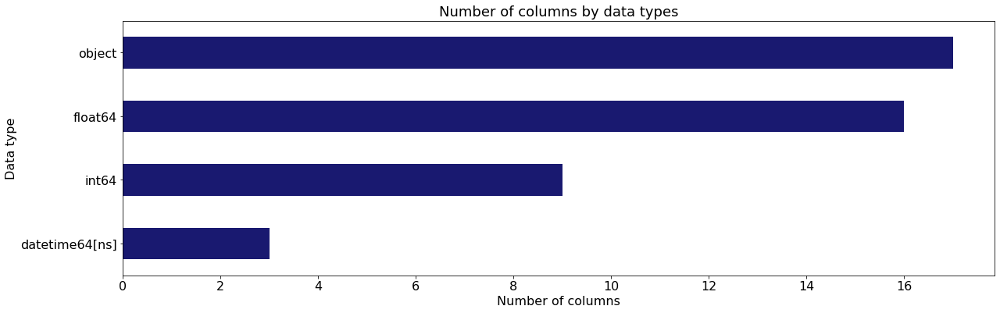

In [11]:
df1.dtypes.value_counts().sort_values().plot(kind='barh',
                                            figsize=(20, 6),
                                            fontsize=16,
                                           color="midnightblue")

plt.title('Number of columns by data types', fontsize=18)
plt.xlabel('Number of columns', fontsize=16)
plt.ylabel('Data type', fontsize=16)

**SUMMARY STATISTICS**

In [12]:
df1.describe()

,host_response_rate,host_acceptance_rate,host_total_listings_count,latitude,longitude,accommodates,bedrooms,beds,price,minimum_nights,...,number_of_reviews,number_of_reviews_ltm,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
count,18505.000000,22379.000000,36994.000000,37012.000000,37012.000000,37012.000000,33404.000000,36522.000000,37012.000000,37012.000000,...,37012.000000,37012.000000,26777.000000,26753.000000,26764.000000,26741.000000,26755.000000,26740.000000,26740.000000,27489.000000
mean,88.525588,80.471245,23.974158,40.729653,-73.950989,2.797633,1.316399,1.533925,142.842240,23.323679,...,22.904112,2.752648,93.767188,9.586551,9.268009,9.721140,9.712801,9.599589,9.367539,0.867197
std,25.023465,28.085157,158.224860,0.054710,0.048291,1.845570,0.722094,1.141557,275.740987,26.441255,...,47.864720,9.582048,9.594491,0.938881,1.146266,0.823948,0.859563,0.794767,1.014201,1.320503
min,0.000000,0.000000,0.000000,40.508680,-74.239860,0.000000,1.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,0.010000
25%,90.000000,73.000000,1.000000,40.690320,-73.983812,2.000000,1.000000,1.000000,60.000000,4.000000,...,0.000000,0.000000,92.000000,9.000000,9.000000,10.000000,10.000000,9.000000,9.000000,0.110000
50%,100.000000,94.000000,1.000000,40.725465,-73.955790,2.000000,1.000000,1.000000,99.000000,30.000000,...,4.000000,0.000000,97.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,0.360000
75%,100.000000,100.000000,2.000000,40.762480,-73.933720,4.000000,1.000000,2.000000,151.000000,30.000000,...,20.000000,2.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,1.120000
max,100.000000,100.000000,2739.000000,40.912140,-73.710870,16.000000,21.000000,42.000000,10000.000000,1250.000000,...,753.000000,514.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,40.310000


**PANDAS PROFILING**

In [13]:
#Generate a HTML report
profile = df1.profile_report(title='Pandas Profiling Report')
#profile

profile.to_file(output_file="profile_report_output.html")

Summarize dataset:   0%|          | 0/58 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Insights from the profile report: 
<br>1. A lot of variables regarding host have missing values; bathrooms variables is all null values
<br>2. Room type and propert type are highly correlated 
<br>3. Avialbility_30, Availability_60 and Availability_90 are highly correlated 

**SOME DATA CLEANING**

A lot of variables include text, hence, they will be need to processed by either modifying them or creating new variables out of them. Most of these columns included description regarding the property or neighbourhood or about the host. Some columns are just dates so having differences between those dates would be more useful. 

In [298]:
#=======================================================Data Cleansing===================================================
#Only pick the Airbnb apartment with reviews
#df1=df1[df1['number_of_reviews'].astype(int)>0]

#Only pick the Airbnb apartment with price
#df1=df1[df1['price']>0]

#Only pick the Airbnb with the answer(t/f) for "host_is_superhost"
#df1=df1[df1['host_is_superhost'].apply(lambda x: len(str(x))==1)]

#Drop other answer except f/t in "instant_bookable"
#df1=df1[df1['instant_bookable'].isin(['f','t'])]

#To drop the review score which lower than 21 (potential outliers)
#df1=df1[df1['review_scores_rating']>21]

#Replace all the blank cell with NaN value
df1=df1.replace('',np.NaN)

#========================================================Add new features===============================================

#Get the length of the sentence in following five columns (number of words)
df1['name_length']  = df1['name'].apply(lambda x: len(str(x).split()))
df1['description_length']=df1['description'].apply(lambda x: len(str(x).split()))
df1['host_about_length']=df1['host_about'].apply(lambda x: len(str(x).split()))
df1['verifications_length']=df1['host_verifications'].apply(lambda x: len(str(x).split(',')))
df1['amenities_length']=df1['amenities'].apply(lambda x: len(str(x).split(',')))

#Get the difference between the "last_scraped" with the following dates (in days)
df1['host_since_days'] = (pd.to_datetime(df1['last_scraped'])-pd.to_datetime(df1['host_since'])).dt.days
df1['first_review_days'] = (pd.to_datetime(df1['last_scraped'])-pd.to_datetime(df1['first_review'])).dt.days
df1['last_review_days'] = (pd.to_datetime(df1['last_scraped'])-pd.to_datetime(df1['last_review'])).dt.days

#drop 'last_scraped, host_since, first_reviews, last_review'
df1 = df1.drop(columns = ['last_scraped', 'host_since','first_review','last_review'])
                          
#Get the new column to express the price per accommodate
df1['price_per_accommodates']=df1['price']/df1['accommodates'].astype(float)
#=====================================================Change the data type=============================================
#Convert the categorical columns to dummified columns
list_col=['host_is_superhost','host_identity_verified','instant_bookable', 'host_has_profile_pic']
for i in list_col:
    df1[i] = np.where(df1[i]== 't', 1, 0)

**CHECK MISSING VALUES**

In [299]:
def missing_values(df):
    mis_val = df.isnull().sum()
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(columns={
        0: 'Missing Values',
        1: '% of Total Values'
    })
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:, 1] != 0].sort_values(
            '% of Total Values', ascending=False).round(1)
    print("Dataframe has " + str(df.shape[1]) + " columns.")
    print("There are " + str(mis_val_table_ren_columns.shape[0]) +
          " columns that have missing values.")
    
    return mis_val_table_ren_columns

# Missing values statistics
miss_values = missing_values(df1)
miss_values

Dataframe has 50 columns.
There are 23 columns that have missing values.


,Missing Values,% of Total Values
host_response_time,18507,50.0
host_response_rate,18507,50.0
host_about,14844,40.1
host_acceptance_rate,14633,39.5
neighborhood_overview,13683,37.0
review_scores_value,10272,27.8
review_scores_location,10272,27.8
review_scores_checkin,10271,27.8
review_scores_accuracy,10259,27.7
review_scores_communication,10257,27.7


<AxesSubplot:>

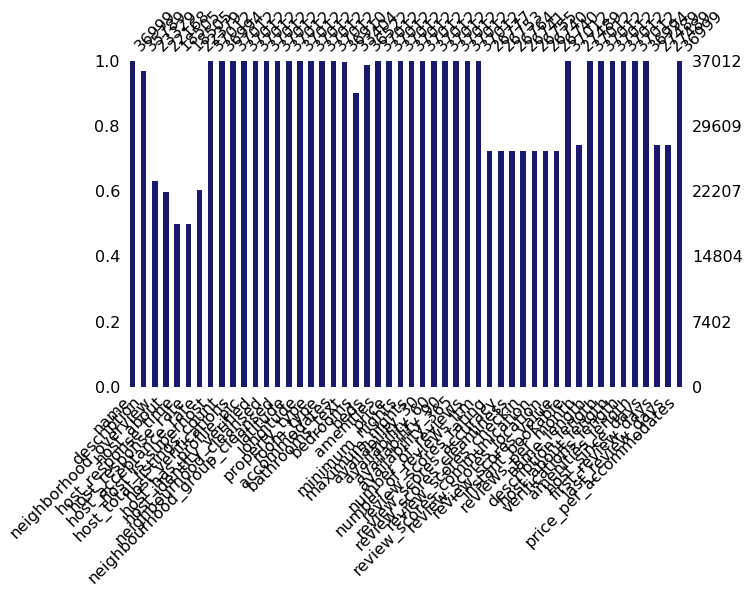

In [300]:
import missingno as msno
#msno.matrix(df.sample(500), figsize=(12,8))
msno.bar(df1, figsize=(10,6), color='midnightblue')

**TARGET VARIABLE**
Check distribution of 'Price' variable

In [301]:
#df1['price'].value_counts().plot(kind='bar', color='midnightblue')

<Figure size 720x504 with 0 Axes>

<AxesSubplot:xlabel='price', ylabel='Density'>

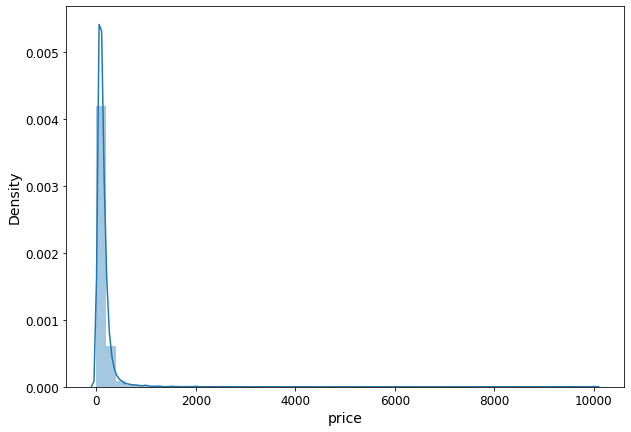

In [302]:
plt.figure(figsize=(10,7))
sns.distplot(df1.price)

The target variable is very heavily right skewed!

**CORRELATIONS between predictors and target variable**

In [303]:
corr = df1.corr()['price'].sort_values()
corr

longitude                     -0.101170
host_response_rate            -0.060710
number_of_reviews             -0.035886
reviews_per_month             -0.030737
host_acceptance_rate          -0.030403
verifications_length          -0.025068
number_of_reviews_ltm         -0.023899
host_identity_verified        -0.018834
host_is_superhost             -0.012657
review_scores_value           -0.007769
review_scores_checkin         -0.007539
host_has_profile_pic          -0.007348
description_length            -0.006389
host_about_length             -0.001419
instant_bookable              -0.000616
maximum_nights                -0.000235
review_scores_communication    0.001680
review_scores_accuracy         0.002778
name_length                    0.003577
host_since_days                0.019429
latitude                       0.019951
review_scores_rating           0.021382
minimum_nights                 0.023094
first_review_days              0.024820
review_scores_cleanliness      0.033119


**There is no multicollinearity between the target variable and the predictors. All correlation values are below 0.8**

**CATEGORICAL VARIABLES**

**Number of categories in each categorical variable**

In [304]:
df1.select_dtypes('object').apply(pd.Series.nunique, axis=0)

name                            35912
description                     33912
neighborhood_overview           19385
host_about                      15481
host_response_time                  4
host_verifications                524
neighbourhood_cleansed            220
neighbourhood_group_cleansed        5
property_type                      75
room_type                           4
bathrooms_text                     36
amenities                       31671
dtype: int64

In [305]:
df1['host_response_time'].value_counts()

within an hour        10143
within a few hours     3937
within a day           3039
a few days or more     1386
Name: host_response_time, dtype: int64

In [306]:
df1['neighbourhood_group_cleansed'].value_counts()

Manhattan        16553
Brooklyn         14474
Queens            4704
Bronx              992
Staten Island      289
Name: neighbourhood_group_cleansed, dtype: int64

In [22]:
df1['property_type'].value_counts().head(50)

Entire apartment                      15506
Private room in apartment             12037
Private room in house                  1897
Private room in townhouse              1044
Entire condominium                      983
Entire house                            949
Entire loft                             628
Entire townhouse                        589
Shared room in apartment                501
Private room in condominium             477
Room in hotel                           371
Private room in loft                    351
Room in boutique hotel                  336
Entire serviced apartment               301
Entire guest suite                      231
Private room in guest suite             103
Shared room in house                     80
Private room in hostel                   52
Room in aparthotel                       51
Entire guesthouse                        45
Room in serviced apartment               43
Shared room in loft                      38
Private room in serviced apartme

In [23]:
df1['room_type'].value_counts()

Entire home/apt    19397
Private room       16630
Shared room          686
Hotel room           299
Name: room_type, dtype: int64

### Some Data Transformation
To make visualization easier and more insightful

**BATHROOM TEXT**

Deriving the number and type of bathroom from the 'bathroom_text' variable

In [307]:
df1['bathrooms_text']=df1['bathrooms_text'].astype(str)
df1['bathrooms_text']=df1['bathrooms_text'].replace('nan','nan nan')

df1['bathrooms_list']  = df1['bathrooms_text'].apply(lambda x: (x.split(" ", 1)))
df1['bathrooms_list']

new_val=[]
for lst in np.array(df1['bathrooms_list']):
    if len(lst)!=2:
        lst.append(" ")
    new_val.append(lst)
    
df1['bathrooms_list']=new_val
list_num=[]
list_name=[]
for i in np.array(df1['bathrooms_list']):
    list_num.append(i[0])
    list_name.append(i[1])
df1['num_bath']=list_num
df1['name_bath']=list_name

df1=df1.drop('bathrooms_list',axis=1)

0               [1, bath]
1               [1, bath]
2              [nan, nan]
3               [1, bath]
4        [1, shared bath]
               ...       
37007           [1, bath]
37008    [1, shared bath]
37009    [1, shared bath]
37010    [1, shared bath]
37011    [1, shared bath]
Name: bathrooms_list, Length: 37012, dtype: object

In [308]:
df1['num_bath'].value_counts().head(20)

#Replace some values to make them numerical
df1['num_bath'] = df1['num_bath'].replace({'Half-bath': 0.5, 'Shared':0.5, 'Private':1})

df1['num_bath'].value_counts().head(20)

1            30654
2             3245
1.5           1802
2.5            400
3              322
0              164
nan            102
4               97
3.5             74
Half-bath       36
4.5             25
Shared          18
Private         17
5               16
6               15
8                9
5.5              5
6.5              4
7.5              3
7                3
Name: num_bath, dtype: int64

1       30654
2        3245
1.5      1802
2.5       400
3         322
0         164
nan       102
4          97
3.5        74
0.5        54
4.5        25
1          17
5          16
6          15
8           9
5.5         5
6.5         4
7.5         3
7           3
15.5        1
Name: num_bath, dtype: int64

In [309]:
df1['name_bath'].value_counts().head(20)

#replace some duplicate categories
df1['name_bath'] = df1['name_bath'].replace({'shared baths': 'shared bath', 'baths':'private bath', 'bath':'private bath'})

df1['name_bath'].value_counts().head(20)

bath            19138
shared bath      9420
baths            3992
shared baths     2193
private bath     2096
nan               102
                   36
half-bath          35
Name: name_bath, dtype: int64

private bath    25226
shared bath     11613
nan               102
                   36
half-bath          35
Name: name_bath, dtype: int64

**PROPERTY TYPE**

In [310]:
df1.property_type.replace({
    'Tiny house': 'House',                           
'Shared room in townhouse':'Townhouse',
'Private room in earth house'           :'Other',
'Shared room in serviced apartment'     :'Apartment',
'Private room in bungalow'              :'Bunglow',
'Entire cottage'                        :'Other',
'Houseboat'                             :'Other',
'Entire villa'                          :'House',
'Boat'                                  :'Other',
'Entire home/apt'                       :'Other',
'Private room in casa particular'       :'Other',
'Private room in floor'                 :'Other',
'Shared room in bed and breakfast'      :'Other',
'Private room in barn'                  :'Other',
'Private room in castle'                :'Other',
'Private room in cottage'               :'Other',
'Barn'                                 :'Other',
'Cave'                                  :'Other',
'Private room in cabin'                 :'Other',
'Shared room in guest suite':'Other',
'Private room in dome house'  :'Other',
'Shared room in guesthouse'   :'Other',
'Private room in dorm'        :'Other',
'Lighthouse'                  :'Other',
'Shared room in island'       :'Other',
'Room in resort'              :'Other',
'Bus'                         :'Other',
'Shared room in earth house'  :'Other',
'Private room in camper/rv'   :'Other',
'Shared room in bungalow'     :'Other',
'Private room in train'       :'Other',
'Private room in farm stay'   :'Other',
'Private room in in-law'  :'Other',
'Private room in lighthouse'  :'Other',          
'Private room in tent'  :'Other',     
'Entire bed and breakfast'  :'Other',
'Room in hostel'   :'Other',
'Shared room in floor':'Other',
'Private room in bed and breakfast': 'Room in bed and breakfast',
'Entire place':'House',                                         
'Shared room in condominium': 'Condo',
'Private room' :'Private room in house',                     
'Camper/RV':'Other',
'Private room in villa' :  'Villa',
'Entire bungalow': 'Bunglow',
'Entire floor':'House',
'Entire resort': 'Other',
'Private room in tiny house':'Other'
    
    }, inplace=True)


In [311]:
df1['property_type'].value_counts()

Entire apartment                      15506
Private room in apartment             12037
Private room in house                  1918
Private room in townhouse              1044
Entire condominium                      983
Entire house                            949
Entire loft                             628
Entire townhouse                        589
Shared room in apartment                501
Private room in condominium             477
Room in hotel                           371
Private room in loft                    351
Room in boutique hotel                  336
Entire serviced apartment               301
Entire guest suite                      231
Private room in guest suite             103
Other                                   103
Shared room in house                     80
House                                    57
Private room in hostel                   52
Room in aparthotel                       51
Entire guesthouse                        45
Room in serviced apartment      

**SENTIMENT SCORE OF HOST AND PROPERTY DESCRIPTIONS**

In [312]:
#!pip install vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()
def sentiment_analyzer_scores(sentence):
    score = analyser.polarity_scores(sentence)
    return score['compound']

In [313]:
dfa=df1[['name','description','neighborhood_overview','host_about']]
dfa['name'] = dfa['name'].fillna("Unknown")
dfa['description'] = dfa['description'].fillna("Unknown")
dfa['neighborhood_overview'] = dfa['neighborhood_overview'].fillna("Unknown")
dfa['host_about'] = dfa['host_about'].fillna("Unknown")

In [314]:
dfa['name_sentiment'] = dfa.apply(lambda row : sentiment_analyzer_scores(row['name']), axis = 1)
dfa['description_sentiment'] = dfa.apply(lambda row : sentiment_analyzer_scores(row['description']), axis = 1)
dfa['neighborhood_sentiment'] = dfa.apply(lambda row : sentiment_analyzer_scores(row['neighborhood_overview']), axis = 1)
dfa['hostabout_sentiment'] = dfa.apply(lambda row : sentiment_analyzer_scores(row['host_about']), axis = 1)

In [315]:
dfa['sentiment'] = (dfa['name_sentiment']+dfa['description_sentiment']+dfa['neighborhood_sentiment']+dfa['hostabout_sentiment'])/4
dfa['sentiment']

0        0.667450
1        0.533675
2        0.488675
3        0.227500
4        0.592700
           ...   
37007    0.000000
37008    0.114700
37009    0.760800
37010    0.860875
37011    0.437025
Name: sentiment, Length: 37012, dtype: float64

In [316]:
#Add the sentiment values into the dataframe
df1['total_sentiment'] = np.NaN
df1['name_sentiment'] = np.NaN
df1['description_sentiment'] = np.NaN
df1['neighborhood_sentiment'] = np.NaN
df1['hostabout_sentiment'] = np.NaN
df1['total_sentiment'].loc[dfa.index] = dfa['sentiment']
df1['name_sentiment'].loc[dfa.index] = dfa['name_sentiment']
df1['description_sentiment'].loc[dfa.index] = dfa['description_sentiment']
df1['neighborhood_sentiment'].loc[dfa.index] = dfa['neighborhood_sentiment']
df1['hostabout_sentiment'].loc[dfa.index] = dfa['hostabout_sentiment']
df1

,name,description,neighborhood_overview,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,...,first_review_days,last_review_days,price_per_accommodates,num_bath,name_bath,total_sentiment,name_sentiment,description_sentiment,neighborhood_sentiment,hostabout_sentiment
0,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,A New Yorker since 2000! My passion is creatin...,within a few hours,93.0,26.0,0,6.0,"['email', 'phone', 'reviews', 'offline_governm...",...,4094.0,459.0,50.000000,1,private bath,0.667450,0.0000,0.9931,0.7089,0.9678
1,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,Laid-back Native New Yorker (formerly bi-coast...,within a few hours,98.0,93.0,0,1.0,"['email', 'phone', 'reviews', 'offline_governm...",...,2320.0,9.0,24.333333,1,private bath,0.533675,0.0000,0.9764,0.8201,0.3382
2,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,"I am an artist(painter, filmmaker) and curato...",NaN,NaN,NaN,0,1.0,"['email', 'phone', 'facebook', 'reviews', 'off...",...,4271.0,431.0,30.000000,nan,nan,0.488675,0.0000,0.9825,0.0000,0.9722
3,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,"Theater district, many restaurants around here.",I used to work for a financial industry but no...,within a day,100.0,100.0,0,1.0,"['email', 'phone', 'facebook', 'reviews']",...,4293.0,133.0,39.500000,1,private bath,0.227500,0.0000,0.9100,0.0000,0.0000
4,Cozy Clean Guest Room - Family Apt,"Our best guests are seeking a safe, clean, spa...",Our neighborhood is full of restaurants and ca...,Welcome to family life with my oldest two away...,NaN,NaN,NaN,0,1.0,"['email', 'phone', 'facebook', 'google', 'revi...",...,4170.0,1296.0,75.000000,1,shared bath,0.592700,0.4019,0.9873,0.0000,0.9816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37007,Cozy One-Bedroom with Full Kitchen Near Manhattan,NaN,NaN,NaN,within an hour,100.0,100.0,0,2.0,"['phone', 'offline_government_id', 'government...",...,NaN,NaN,30.000000,1,private bath,0.000000,0.0000,0.0000,0.0000,0.0000
37008,Grand Concourse Gem,NaN,NaN,"Native New Yorker\nEclectic dabbler (writer, p...",NaN,NaN,0.0,0,1.0,"['email', 'phone', 'offline_government_id', 'g...",...,NaN,NaN,520.000000,1,shared bath,0.114700,0.4588,0.0000,0.0000,0.0000
37009,Natural Light-Filled Home in Upper East Side,"Private room with Queen bed in a 4 bedroom, 4 ...",Welcome to The Upper East Side – located north...,"At June Homes, our mission is to make renting ...",within an hour,100.0,53.0,0,1.0,"['email', 'phone', 'jumio', 'offline_governmen...",...,NaN,NaN,63.000000,1,shared bath,0.760800,0.3612,0.8555,0.9442,0.8823
37010,Spacious Living in the Heart of Upper East Side,"Private room with Queen bed in a 2 bedroom, 1 ...",Welcome to The Upper East Side – located north...,"At June Homes, our mission is to make renting ...",within an hour,100.0,53.0,0,1.0,"['email', 'phone', 'jumio', 'offline_governmen...",...,NaN,NaN,67.000000,1,shared bath,0.860875,0.6369,0.9801,0.9442,0.8823


**AMENITIES**

Amenities are all present in a list. Although we have calculated the length of list of amenities in a list, it would be useful to see what amenities are usually listed and make those categorical variables.

In [317]:
#creating set of all amenties
amenities = list(df1.amenities)
amenities_list = " ".join(amenities)
amenities_list = amenities_list.replace('[', '')
amenities_list = amenities_list.replace(']', ',')
amenities_list= amenities_list.replace('"', '')
amenities_set = [x.strip() for x in amenities_list.split(',')]
amenities_set = set(amenities_set)
amenities_set

{'',
 '1 space',
 '100\\ HDTV with Netflix',
 '120\\ HDTV with Amazon Prime Video',
 '120\\ HDTV with Apple TV',
 '12\\ TV',
 '1802 Beekman toiletries',
 '2 burner induction cooktop.  We provide pots and pans. induction stove',
 '2 spaces',
 '2-5 years old',
 '20\\ TV with standard cable',
 '24-hour fitness center',
 '24\\ HDTV with Chromecast',
 '30\\ HDTV',
 '32\\ HDTV',
 '32\\ HDTV with Amazon Prime Video',
 '32\\ HDTV with Chromecast',
 '32\\ HDTV with HBO Max',
 '32\\ HDTV with Netflix',
 '32\\ HDTV with Roku',
 '32\\ TV',
 '36\\ TV',
 '36\\ TV with Chromecast',
 '37\\ HDTV with Netflix',
 '37\\ TV with Amazon Prime Video',
 '39\\ HDTV',
 '40\\ HDTV',
 '40\\ HDTV with Apple TV',
 '40\\ HDTV with Chromecast',
 '40\\ HDTV with Netflix',
 '40\\ HDTV with Roku',
 '40\\ HDTV with standard cable',
 '40\\ TV with Netflix',
 '40\\ TV with premium cable',
 '42\\ HDTV with Amazon Prime Video',
 '42\\ HDTV with Netflix',
 '42\\ HDTV with premium cable',
 '42\\ TV',
 '43\\ HDTV',
 '43\\ HDTV 

In the list above, some amenities are more important than others (e.g. a parking lot is more important that a shampoo). Based on research and personal experiences, some of the most important amentities will be selected. Some of the amenities such as wifi, stove top are standard across all listings so they weren't included in the list

The amenities chosen are (slashes indicate those categories that can be combined):

<br>Air conditioning/Central air conditioning
<br>BBQ grill
<br>Patio 
<br>beachfront/lake access
<br>Breakfast/Complimentary breakfast buffet/ Complimentary continental breakfast/ Complimentary hot breakfast
<br>Cable TV/TV
<br>Coffee maker/ Keurig coffee machine
<br>Breakfast/Complimentary breakfast buffet/ Complimentary continental breakfast/ Complimentary hot breakfast
<br>Cooking basics
<br>Dishwasher/Dryer/Washer
<br>Gym/Private gym/Shared gym/ Shared gym in building/
<br>Free parking on premises/Free street parking/outdoor parking/paid parking off premises/paid parking on premises
<br>Hot tub/Private hot tub/shared hot tub/Shared pool/Shared sauna/private hot tub
<br>Long term stays allowed
<br>Pets allowed
<br>Private entrance
<br>Safe/security system
<br>Microwave

In [318]:
import requests
import nltk
import nltk.corpus
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string
from nltk.corpus import stopwords, wordnet
from nltk.stem import WordNetLemmatizer
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\shiva\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\shiva\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\shiva\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [319]:
df = df1[['amenities']]
df.head()

df = df[df['amenities'].notnull()]

#expand contraction words
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won\'t", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)
    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

df['pros1'] = df.apply(lambda row : decontracted(row['amenities']), axis = 1)

#Tokenization the comments column
def token_(x):
    token = word_tokenize(x)
    return token
df['pros_token'] = df.apply(lambda row : token_(row['pros1']), axis = 1)

# Lower Casing the Tokenized comments
def lower_case(x):
    ret = []
    for words in x:
        words = words.lower()
        ret.append(words)
    return ret 
df['pros_token'] = df.apply(lambda row : lower_case(row['pros_token']), axis = 1)

# Removing Punctuation
import re 
punctutation = re.compile(r'[-.?!,:;()%\/|0-9""]')
def post_punctutation(x):
    ret = []
    for words in x:
        item = punctutation.sub("",words)
        if len(item)>0:
            ret.append(item)
    return ret 
df['pros_token'] = df.apply(lambda row : post_punctutation(row['pros_token']), axis = 1)
#len(df['Comment_token_punct'][0]), len(df['Comment_token'][0])

#Stopwords
stop_words = set(stopwords.words('english'))
def remove_stopwords(x):
    filtered_sentence = []  
    for w in x:
        if w not in stop_words:
            filtered_sentence.append(w)
    return filtered_sentence
df['pros_stopwords'] = df.apply(lambda row : remove_stopwords(row['pros_token']), axis = 1)
#len(df['Comment_token_punct_stopwords'][0]),len(df['Comment_token_punct'][0]),

#POS Tagging
nltk.download('averaged_perceptron_tagger')
df['pros_tags'] = df['pros_stopwords'].apply(nltk.tag.pos_tag)

def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN
df['wordnet_pos'] = df['pros_tags'].apply(lambda x: [(word, get_wordnet_pos(pos_tag)) for (word, pos_tag) in x])

wnl = WordNetLemmatizer()
df['lemmatized'] = df['wordnet_pos'].apply(lambda x: [wnl.lemmatize(word, tag) for word, tag in x])

# ALl the duplicate words will be removed from the text/comments including all the adjectives and verbs.
def unique_(test_list):
    res = [] 
    for i in test_list: 
        if i not in res: 
            res.append(i) 
    return res
df['pros_unique'] = df.apply(lambda row : unique_(row['lemmatized']), axis = 1)
#len(df['Comment_token_punct_stopwords_unique'][0]),len(df['lemmatized'][0]),

#select nouns only
df['nouns'] = df['wordnet_pos'].apply(lambda x: [word for (word, pos) in x if pos[0] == 'n'])

text_list=df['nouns'].tolist()
#print(text_list[0])


,amenities
0,"[""Refrigerator"", ""Air conditioning"", ""Baking s..."
1,"[""Refrigerator"", ""Microwave"", ""Shampoo"", ""High..."
2,"[""Wifi"", ""Heating"", ""Air conditioning"", ""Long ..."
3,"[""Extra pillows and blankets"", ""Hair dryer"", ""..."
4,"[""Hair dryer"", ""Breakfast"", ""Smoke alarm"", ""Es..."


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\shiva\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [320]:
#another method
from nltk.probability import FreqDist
fdist = FreqDist()
for i in range(len(df)):
    for word in text_list[i]:
        fdist[word]+=1
word_freqs2 = pd.DataFrame(fdist.items(), columns = ['word', 'frequency']).sort_values(by = ['frequency'], ascending = False)

word_freqs2.head(30)

,word,frequency
3,'',757063
1,``,756941
14,alarm,59322
24,dryer,39216
39,],37012
30,wifi,36534
31,heating,34922
20,stays,34838
19,term,34838
29,tv,34457


In addition to the analysis above, we did some research and came up with the top amenities that most guests look for

In [321]:
list_name=['air_conditioning_available','bbq_available','patio','beach','breakfast_available',
           'tv_available','coffee_machine_available', 'cooking_basics','dishwasher_available',
           'washer and dryer_available','gym','parking','hot_tub_sauna_or_pool','long_term_stays_allowed',
           'pets_allowed','private_entrance','secure','microwave_available']

for i in list_name:
    df1[i]=[0]*len(df1)
df1.loc[df1['amenities'].str.contains('Air conditioning|Central air conditioning'), 'air_conditioning_available'] = 1
df1.loc[df1['amenities'].str.contains('BBQ grill'), 'bbq_available'] = 1
df1.loc[df1['amenities'].str.contains('Patio'), 'patio'] = 1
df1.loc[df1['amenities'].str.contains('Beachfront|Lake access'), 'beach'] = 1
df1.loc[df1['amenities'].str.contains('Breakfast|Complimentary breakfast buffet|Complimentary continental breakfast|Complimentary hot breakfast'), 'breakfast_available'] = 1
df1.loc[df1['amenities'].str.contains('TV|Cable TV'), 'tv_available'] = 1
df1.loc[df1['amenities'].str.contains('Coffee maker|Keurig coffee machine'), 'coffee_machine_available'] = 1
df1.loc[df1['amenities'].str.contains('Cooking basics'), 'cooking_basics'] = 1
df1.loc[df1['amenities'].str.contains('Dishwasher'), 'dishwasher_available'] = 1
df1.loc[df1['amenities'].str.contains('Dryer|Washer'), 'washer and dryer_available'] = 1
df1.loc[df1['amenities'].str.contains('Gym|gym|Gym/Private gym|Shared gym|Shared gym in building'), 'gym'] = 1
df1.loc[df1['amenities'].str.contains('Free parking on premises|Free street parking|outdoor parking|paid parking off premises|paid parking on premise'), 'parking'] = 1
df1.loc[df1['amenities'].str.contains('Hot tub|Private hot tub|shared hot tub|Shared pool|Shared sauna|private hot tub'), 'hot_tub_sauna_or_pool'] = 1
df1.loc[df1['amenities'].str.contains('Long term stays allowed'), 'long_term_stays_allowed'] = 1
df1.loc[df1['amenities'].str.contains('pets allowed'), 'pets_allowed'] = 1
df1.loc[df1['amenities'].str.contains('Private entrance'), 'private_entrance'] = 1
df1.loc[df1['amenities'].str.contains('Safe|Security system'), 'secure'] = 1
df1.loc[df1['amenities'].str.contains('Microwave'), 'microwave_available'] = 1

In [322]:
df1

,name,description,neighborhood_overview,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,...,dishwasher_available,washer and dryer_available,gym,parking,hot_tub_sauna_or_pool,long_term_stays_allowed,pets_allowed,private_entrance,secure,microwave_available
0,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,A New Yorker since 2000! My passion is creatin...,within a few hours,93.0,26.0,0,6.0,"['email', 'phone', 'reviews', 'offline_governm...",...,0,0,0,1,0,1,0,0,0,0
1,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,Laid-back Native New Yorker (formerly bi-coast...,within a few hours,98.0,93.0,0,1.0,"['email', 'phone', 'reviews', 'offline_governm...",...,0,0,0,1,0,1,0,0,0,1
2,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,"I am an artist(painter, filmmaker) and curato...",NaN,NaN,NaN,0,1.0,"['email', 'phone', 'facebook', 'reviews', 'off...",...,0,0,0,0,0,1,0,0,0,0
3,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,"Theater district, many restaurants around here.",I used to work for a financial industry but no...,within a day,100.0,100.0,0,1.0,"['email', 'phone', 'facebook', 'reviews']",...,0,0,0,1,0,0,0,0,0,1
4,Cozy Clean Guest Room - Family Apt,"Our best guests are seeking a safe, clean, spa...",Our neighborhood is full of restaurants and ca...,Welcome to family life with my oldest two away...,NaN,NaN,NaN,0,1.0,"['email', 'phone', 'facebook', 'google', 'revi...",...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37007,Cozy One-Bedroom with Full Kitchen Near Manhattan,NaN,NaN,NaN,within an hour,100.0,100.0,0,2.0,"['phone', 'offline_government_id', 'government...",...,0,0,0,0,0,1,0,1,0,0
37008,Grand Concourse Gem,NaN,NaN,"Native New Yorker\nEclectic dabbler (writer, p...",NaN,NaN,0.0,0,1.0,"['email', 'phone', 'offline_government_id', 'g...",...,1,1,0,1,0,1,0,0,1,1
37009,Natural Light-Filled Home in Upper East Side,"Private room with Queen bed in a 4 bedroom, 4 ...",Welcome to The Upper East Side – located north...,"At June Homes, our mission is to make renting ...",within an hour,100.0,53.0,0,1.0,"['email', 'phone', 'jumio', 'offline_governmen...",...,1,1,0,0,0,1,0,0,0,1
37010,Spacious Living in the Heart of Upper East Side,"Private room with Queen bed in a 2 bedroom, 1 ...",Welcome to The Upper East Side – located north...,"At June Homes, our mission is to make renting ...",within an hour,100.0,53.0,0,1.0,"['email', 'phone', 'jumio', 'offline_governmen...",...,0,0,0,0,0,1,0,0,0,0


In [323]:
df1.columns

Index(['name', 'description', 'neighborhood_overview', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'number_of_reviews_ltm', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'instant_bookable',
       'reviews_per_month', 'name_length', 'description_length',
       'host_about_length', 'verificatio

In [324]:
#Determining which amenities are present in less than 10% of listings

# Replacing nulls with zeros for new columns
nulls_replace = df1.iloc[:,57:].columns
#nulls_replace_list = nulls_replace.to_list()
#df1[nulls_replace] = df1[nulls_replace].fillna(0)

# Produces a list of amenity features where one category (true or false) contains fewer than 10% of listings
fewer_amenities = []
for col in nulls_replace:
    if df1[col].sum() < len(df1)/10:
        fewer_amenities.append(col)
print("Fewer amenities include", fewer_amenities)

# Dropping infrequent amenity features
#test = df1.drop(columns=['bbq_available', 'patio', 'beach', 'breakfast_available', 'hot_tub_sauna_or_pool', 'pets_allowed', 'secure'], axis=1, inplace=True)

Fewer amenities include ['bbq_available', 'patio', 'beach', 'breakfast_available', 'hot_tub_sauna_or_pool', 'pets_allowed', 'secure']


In the pre-processing stage, we will need to delete the 'fewer amenities'

### B) Data Visualization

So far we have added all the necessary features. Now we can drop some features that might not be used in the analysis. We can also look for correlated variables and drop those.

In [325]:
#creating a new dataset so that if we need some columns later we can use df1

df2 = df1.copy(deep = True)
df2

,name,description,neighborhood_overview,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,...,dishwasher_available,washer and dryer_available,gym,parking,hot_tub_sauna_or_pool,long_term_stays_allowed,pets_allowed,private_entrance,secure,microwave_available
0,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,A New Yorker since 2000! My passion is creatin...,within a few hours,93.0,26.0,0,6.0,"['email', 'phone', 'reviews', 'offline_governm...",...,0,0,0,1,0,1,0,0,0,0
1,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,Laid-back Native New Yorker (formerly bi-coast...,within a few hours,98.0,93.0,0,1.0,"['email', 'phone', 'reviews', 'offline_governm...",...,0,0,0,1,0,1,0,0,0,1
2,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,"I am an artist(painter, filmmaker) and curato...",NaN,NaN,NaN,0,1.0,"['email', 'phone', 'facebook', 'reviews', 'off...",...,0,0,0,0,0,1,0,0,0,0
3,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,"Theater district, many restaurants around here.",I used to work for a financial industry but no...,within a day,100.0,100.0,0,1.0,"['email', 'phone', 'facebook', 'reviews']",...,0,0,0,1,0,0,0,0,0,1
4,Cozy Clean Guest Room - Family Apt,"Our best guests are seeking a safe, clean, spa...",Our neighborhood is full of restaurants and ca...,Welcome to family life with my oldest two away...,NaN,NaN,NaN,0,1.0,"['email', 'phone', 'facebook', 'google', 'revi...",...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37007,Cozy One-Bedroom with Full Kitchen Near Manhattan,NaN,NaN,NaN,within an hour,100.0,100.0,0,2.0,"['phone', 'offline_government_id', 'government...",...,0,0,0,0,0,1,0,1,0,0
37008,Grand Concourse Gem,NaN,NaN,"Native New Yorker\nEclectic dabbler (writer, p...",NaN,NaN,0.0,0,1.0,"['email', 'phone', 'offline_government_id', 'g...",...,1,1,0,1,0,1,0,0,1,1
37009,Natural Light-Filled Home in Upper East Side,"Private room with Queen bed in a 4 bedroom, 4 ...",Welcome to The Upper East Side – located north...,"At June Homes, our mission is to make renting ...",within an hour,100.0,53.0,0,1.0,"['email', 'phone', 'jumio', 'offline_governmen...",...,1,1,0,0,0,1,0,0,0,1
37010,Spacious Living in the Heart of Upper East Side,"Private room with Queen bed in a 2 bedroom, 1 ...",Welcome to The Upper East Side – located north...,"At June Homes, our mission is to make renting ...",within an hour,100.0,53.0,0,1.0,"['email', 'phone', 'jumio', 'offline_governmen...",...,0,0,0,0,0,1,0,0,0,0


Consideing we have already added difference between days we can get rid last_scraped,host_since, first_review, last_review. Additionally, for all the columns with text, we have laready calculated their length so we cam drop those columns as well, such as name, description, neighbourhood_overview, amenities.

In [326]:
df2 = df2.drop(columns = ['name', 'description', 'host_about','neighborhood_overview','amenities','property_type'])

<Figure size 2160x1080 with 0 Axes>

Text(0.5, 1.0, 'Correlation Heatmap')

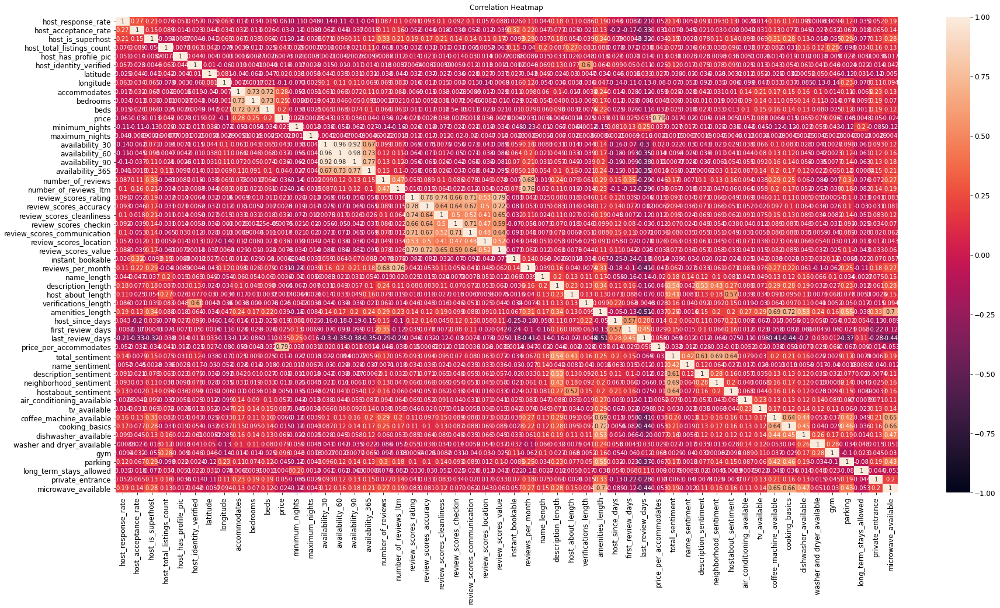

In [48]:
import seaborn as sns
data_corr = df2.corr()
plt.figure(figsize=(30, 15))
heatmap = sns.heatmap(data_corr, vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

In [327]:
corr_matrix = df2.corr()

mat = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
                  .stack()
                  .sort_values(ascending=False))
mat

availability_60       availability_90             0.983451
availability_30       availability_60             0.964108
                      availability_90             0.924654
review_scores_rating  review_scores_value         0.794091
price                 price_per_accommodates      0.792852
                                                    ...   
reviews_per_month     last_review_days           -0.405986
last_review_days      coffee_machine_available   -0.412779
                      cooking_basics             -0.436137
                      microwave_available        -0.437101
amenities_length      last_review_days           -0.514481
Length: 1770, dtype: float64

Anything above 75% is considered multicollinear. From the above results, we can see that availability_30, availability_60, and availability_90 are highly correlated to each other. Since New York has recently applied a rule that no rental can be less than 30 days, its better to keep availablity_90 and drop the rest. review_scores_ratings, review_scores_accuracy, and review_scores_values are correlated as well so onlt review_score_accuracy will be kept. 

In [328]:
df2 = df2.drop(columns = ['availability_30', 'availability_60','review_scores_rating','review_scores_value'])

In [329]:
corr_matrix=df2.corr()
corr_matrix["price"].sort_values(ascending=False)

price                          1.000000
price_per_accommodates         0.792852
accommodates                   0.276537
bedrooms                       0.251487
beds                           0.201769
gym                            0.095686
tv_available                   0.086851
washer and dryer_available     0.079427
dishwasher_available           0.064528
air_conditioning_available     0.056686
private_entrance               0.049617
patio                          0.047347
host_total_listings_count      0.047327
availability_365               0.040333
amenities_length               0.038721
hot_tub_sauna_or_pool          0.037612
review_scores_location         0.036454
availability_90                0.035982
bbq_available                  0.034971
last_review_days               0.034556
review_scores_cleanliness      0.033119
first_review_days              0.024820
minimum_nights                 0.023094
latitude                       0.019951
host_since_days                0.019429


None of the newly added variables correlate highly with the price, so this is good!

**Visualization of all predictors**

In [50]:
#sns.set(style="ticks")

#sns.pairplot(df2, hue="price", palette="Set1")
#plt.show()

**Visualize distribution of numerical variables**

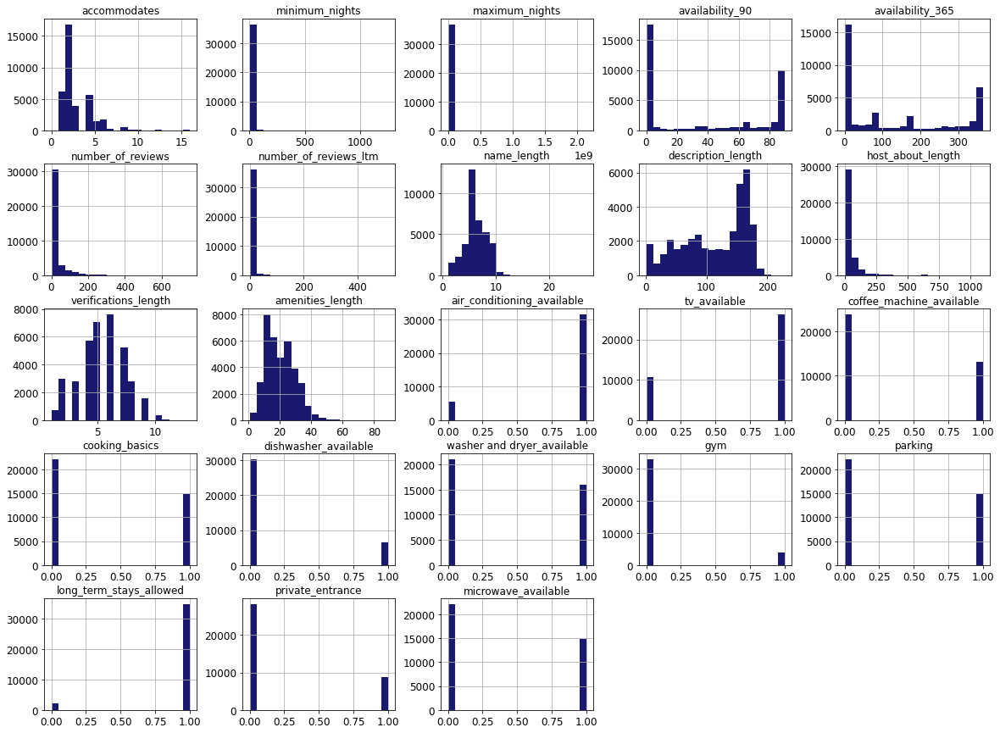

In [51]:
num_vars = df2.select_dtypes('int64', 'float64')

num_vars.hist(bins=20, figsize=(20,15), color='midnightblue')
plt.show();

**Visualize distribution of Categorical Variables**
*Please Note that this take a VERY long time to run!

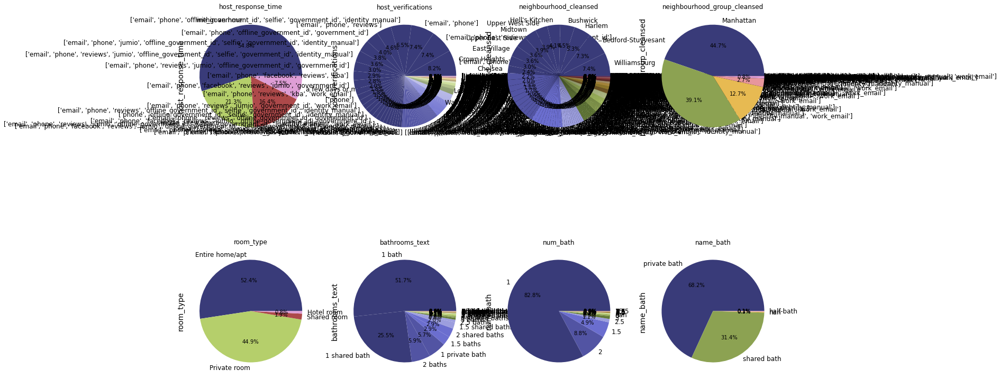

In [52]:
cat_vars = df2.select_dtypes('object')

fig, axes = plt.subplots(round(len(cat_vars.columns) / 4), 4, figsize=(20, 15))

for i, ax in enumerate(fig.axes):
    if i < len(cat_vars.columns):
        cat_vars[cat_vars.columns[i]].value_counts().plot.pie(autopct = '%1.1f%%',ax = ax, colormap='tab20b')
        #ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
        ax.set_title(cat_vars.columns[i])

fig.tight_layout();

# Data Exploration 

Does score of review rating have an impact on price? 

<Figure size 720x504 with 0 Axes>

Text(0.5, 1.0, 'Price as a function of Review Scores Rating')

Text(0.5, 0, 'Review Scores Rating')

Text(0, 0.5, 'Price')

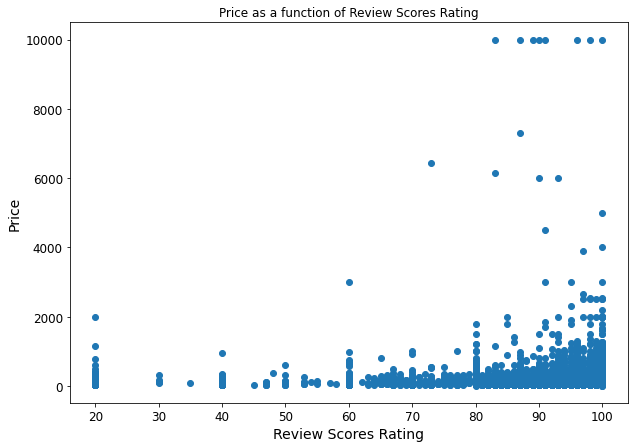

In [330]:
plt.figure(figsize=(10,7))
plt.scatter(x='review_scores_rating', y="price", data=df1)
plt.title('Price as a function of Review Scores Rating') #title
plt.xlabel('Review Scores Rating') #x label
plt.ylabel('Price') #y la

From the scatter plot above, it doesn't seem like there is a relationship between price and review scores rating. Hence, it is concluded that it would not be useful to predict rating before predicting price. This observation will be tested during feature analysis still. 

Geographic Distribution 

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

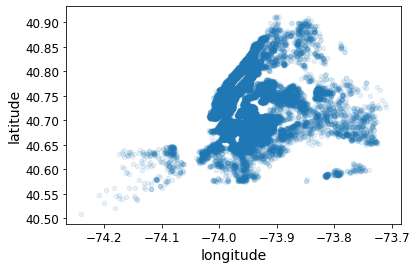

In [39]:
df1.plot(kind="scatter", x="longitude", y="latitude", alpha=0.1)
plt.savefig("better_visualization_plot")

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

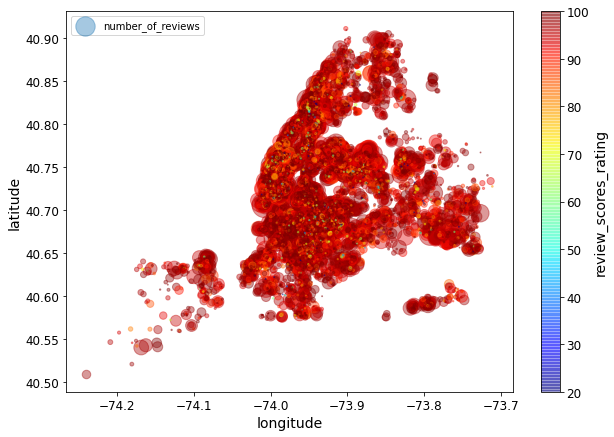

In [40]:
df1.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,
    s=df1["number_of_reviews"], label="number_of_reviews", figsize=(10,7),
    c="review_scores_rating", cmap=plt.get_cmap("jet"), colorbar=True,
    sharex=False)
plt.legend()
plt.savefig("Airbnb_review_rating_scatterplot")

Let's see if there are any amenities that particularly have any impact on the price

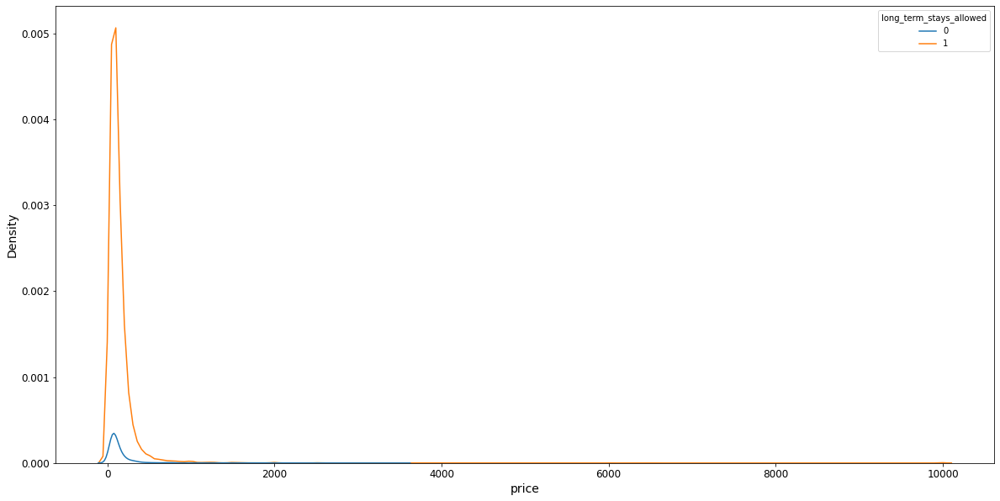

In [331]:
fig = plt.figure(figsize=(20,10)) 
graphs=sns.kdeplot(x = 'price', data=df2, hue = 'long_term_stays_allowed')

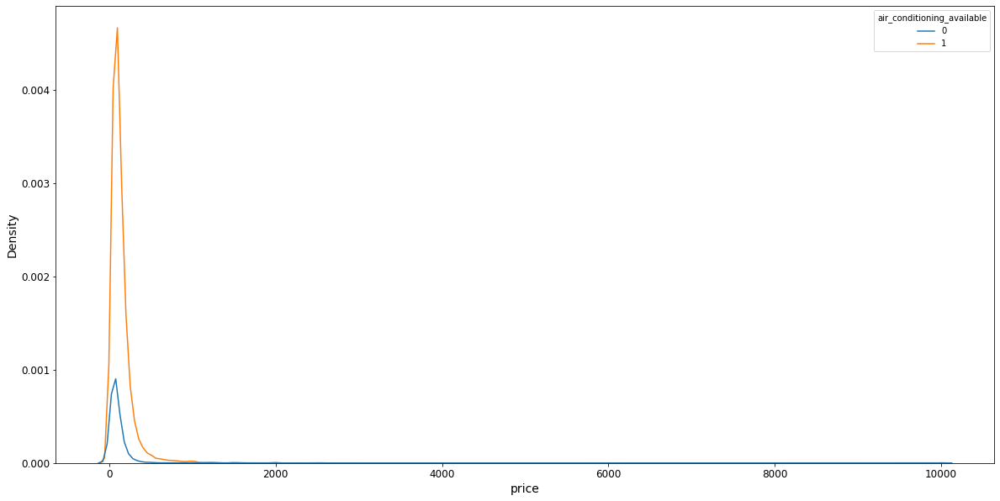

In [57]:
fig = plt.figure(figsize=(20,10)) 
graphs=sns.kdeplot(x = 'price', data=df2, hue = 'air_conditioning_available')

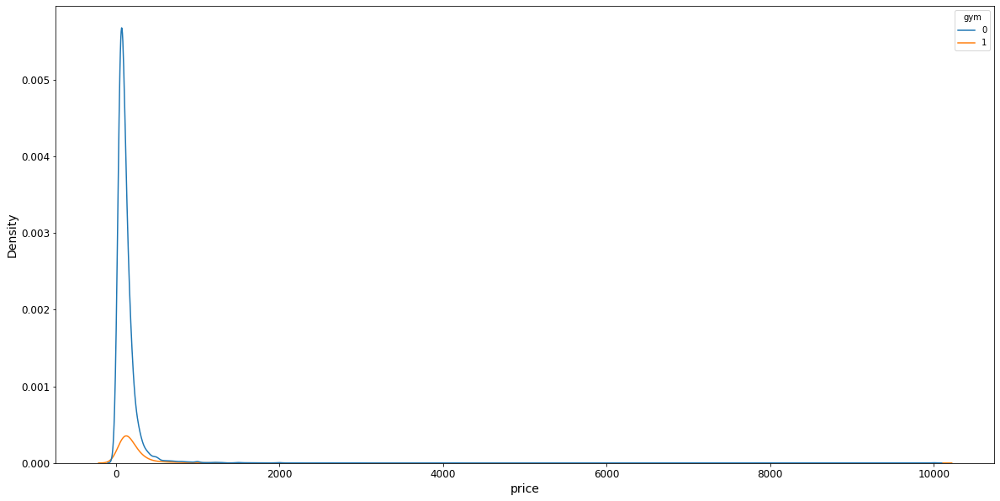

In [58]:
fig = plt.figure(figsize=(20,10)) 
graphs=sns.kdeplot(x = 'price', data=df2, hue = 'gym', gridsize = 2000)

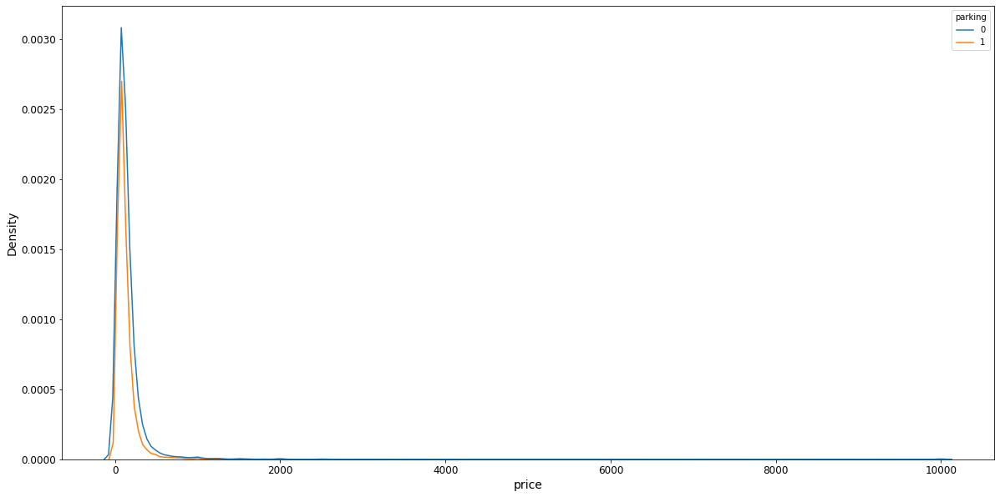

In [59]:
fig = plt.figure(figsize=(20,10)) 
graphs=sns.kdeplot(x = 'price', data=df2, hue = 'parking')

The distribution of price for the presence and absence of these amenities are similar, implying that there many not be any amenity that leads to higher price. 

Effect on amenities length on price

<Figure size 720x504 with 0 Axes>

Text(0.5, 1.0, 'Price as a function of length of amenities')

Text(0.5, 0, 'length of Amenities')

Text(0, 0.5, 'Price')

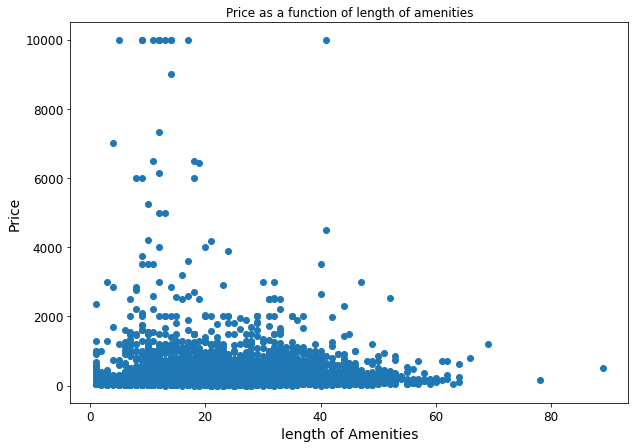

In [60]:
plt.figure(figsize=(10,7))
plt.scatter(x='amenities_length', y="price", data=df1)
plt.title('Price as a function of length of amenities') #title
plt.xlabel('length of Amenities') #x label
plt.ylabel('Price') #y la

From the scatter plot above, it is hard to interpret if there is a relationship between length of amenities and price. We will further test this observation during feature engineering.

# 3 - Data Pre-Processing

### Train-Val-Test Split

In [332]:
#Drop variables that are duplicates
df2 = df2.drop(columns = ['host_verifications','neighbourhood_cleansed', 'latitude','longitude', 'bathrooms_text'])

In [333]:
df3 = df2.copy(deep = True)

In [334]:
df3.shape

(37012, 60)

In [335]:
import numpy as np

def split_train_test(data, test_ratio):
    shuffled_indices = np.random.permutation(len(data))
    test_set_size = int(len(data) * test_ratio)
    test_indices = shuffled_indices[:test_set_size]
    train_indices = shuffled_indices[test_set_size:]
    return data.iloc[train_indices], data.iloc[test_indices]

In [336]:
train_set,valid_set=split_train_test(df3,0.3)
print("The length of train set is: ",len(train_set))
print("The length of valid set is: ",len(valid_set))

The length of train set is:  25909
The length of valid set is:  11103


In [337]:
valid_set,test_set=split_train_test(valid_set,0.4)
print("The length of valid set is: ",len(valid_set))
print("The length of test set is: ",len(test_set))

The length of valid set is:  6662
The length of test set is:  4441


In [338]:
train_set.shape, test_set.shape

((25909, 60), (4441, 60))

### Missing Values

In [339]:
# Missing values statistics
miss_values = missing_values(train_set)
miss_values

Dataframe has 60 columns.
There are 16 columns that have missing values.


,Missing Values,% of Total Values
host_response_time,13061,50.4
host_response_rate,13061,50.4
host_acceptance_rate,10319,39.8
review_scores_location,7198,27.8
review_scores_checkin,7195,27.8
review_scores_accuracy,7186,27.7
review_scores_communication,7184,27.7
review_scores_cleanliness,7178,27.7
reviews_per_month,6669,25.7
first_review_days,6669,25.7


**FLAGGING MISSING VALUES**

In [340]:
cols = miss_values.index
df_try = train_set[cols].isnull().astype(int).add_suffix('_indicator')
#df_try

#merge both the df1 and the flagged columns
train_set = pd.merge(train_set, df_try, left_index=True, right_index=True)
train_set.head(10)

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,room_type,accommodates,...,review_scores_communication_indicator,review_scores_cleanliness_indicator,reviews_per_month_indicator,first_review_days_indicator,last_review_days_indicator,bedrooms_indicator,beds_indicator,host_total_listings_count_indicator,host_since_days_indicator,price_per_accommodates_indicator
7263,within a few hours,87.0,48.0,0,51.0,1,1,Manhattan,Entire home/apt,4,...,0,0,0,0,0,0,0,0,0,0
33481,within an hour,94.0,98.0,1,0.0,1,0,Brooklyn,Entire home/apt,3,...,0,0,0,0,0,0,0,0,0,0
7823,within an hour,100.0,100.0,1,2.0,1,1,Manhattan,Private room,2,...,0,0,0,0,0,1,0,0,0,0
31948,NaN,NaN,100.0,0,0.0,1,1,Brooklyn,Entire home/apt,2,...,0,0,0,0,0,1,0,0,0,0
27755,NaN,NaN,NaN,0,0.0,1,1,Manhattan,Private room,2,...,0,0,0,0,0,0,0,0,0,0
17864,NaN,NaN,NaN,1,1.0,1,1,Bronx,Private room,2,...,0,0,0,0,0,0,0,0,0,0
11747,NaN,NaN,NaN,0,1.0,1,0,Brooklyn,Entire home/apt,2,...,0,0,0,0,0,0,0,0,0,0
19461,NaN,NaN,NaN,0,1.0,1,1,Bronx,Private room,2,...,0,0,0,0,0,0,0,0,0,0
35087,within a few hours,63.0,100.0,0,1.0,1,1,Manhattan,Entire home/apt,2,...,1,1,1,1,1,1,1,0,0,0
12659,NaN,NaN,0.0,0,1.0,1,1,Manhattan,Entire home/apt,2,...,0,0,0,0,0,0,0,0,0,0


**ITERATIVE IMPUTER** For numerical variables

In [341]:
train_set.columns

Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_group_cleansed', 'room_type', 'accommodates', 'bedrooms',
       'beds', 'price', 'minimum_nights', 'maximum_nights', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'instant_bookable', 'reviews_per_month',
       'name_length', 'description_length', 'host_about_length',
       'verifications_length', 'amenities_length', 'host_since_days',
       'first_review_days', 'last_review_days', 'price_per_accommodates',
       'num_bath', 'name_bath', 'total_sentiment', 'name_sentiment',
       'description_sentiment', 'neighborhood_sentiment',
       'hostabout_sentiment', 'air_condition

In [342]:
#choose numerical variables only
df_num = train_set.drop(columns=['host_response_time', 'neighbourhood_group_cleansed','name_bath', 'room_type'])
#df_num=df3[['host_response_rate', 'host_acceptance_rate','review_scores_value', 'review_scores_location',
#                     'review_scores_checkin','review_scores_accuracy','review_scores_communication',
#                     'review_scores_cleanliness','review_scores_rating','reviews_per_month','first_review_days',
#                     'last_review_days','bedrooms','beds','host_total_listings_count','host_since_days']]

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imp = IterativeImputer(random_state=0)

df_num1 = imp.fit_transform(df_num)

cols = list(df_num)

df_num1=pd.DataFrame(df_num1)
df_num1.columns=cols

# Re-check Missing values statistics
miss_values = missing_values(df_num1)
miss_values.head(20)

Dataframe has 72 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


**Now, replace the incomplete columns in train_set with the corresponding imputed columns from df_num1**

In [343]:
train_set[cols] = df_num1[cols].values

train_set.head(5)

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,room_type,accommodates,...,review_scores_communication_indicator,review_scores_cleanliness_indicator,reviews_per_month_indicator,first_review_days_indicator,last_review_days_indicator,bedrooms_indicator,beds_indicator,host_total_listings_count_indicator,host_since_days_indicator,price_per_accommodates_indicator
7263,within a few hours,87.000000,48.000000,0.0,51.0,1.0,1.0,Manhattan,Entire home/apt,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
33481,within an hour,94.000000,98.000000,1.0,0.0,1.0,0.0,Brooklyn,Entire home/apt,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7823,within an hour,100.000000,100.000000,1.0,2.0,1.0,1.0,Manhattan,Private room,2.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
31948,NaN,91.328967,100.000000,0.0,0.0,1.0,1.0,Brooklyn,Entire home/apt,2.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
27755,NaN,79.543345,85.221963,0.0,0.0,1.0,1.0,Manhattan,Private room,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [344]:
# Re-check Missing values statistics
miss_values = missing_values(train_set)
miss_values.head(20)

Dataframe has 76 columns.
There are 1 columns that have missing values.


,Missing Values,% of Total Values
host_response_time,13061,50.4


**We have taken care of the numerical values, and need to work on the categorical values next...**

In [345]:
train_set['host_response_time'].mode()

0    within an hour
dtype: object

In [346]:
train_set['host_response_time'] = train_set['host_response_time'].fillna("within an hour")

In [347]:
# Check Missing values statistics again
miss_values = missing_values(train_set)
miss_values.head(20)

Dataframe has 76 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


### Categorical Encoding

In [348]:
train_set = pd.get_dummies(train_set, columns=['host_response_time','neighbourhood_group_cleansed','name_bath', 'room_type'])

In [349]:
train_set.head(5)

,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bedrooms,beds,price,...,neighbourhood_group_cleansed_Staten Island,name_bath_,name_bath_half-bath,name_bath_nan,name_bath_private bath,name_bath_shared bath,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room
7263,87.000000,48.000000,0.0,51.0,1.0,1.0,4.0,2.000000,2.0,165.0,...,0,0,0,0,1,0,1,0,0,0
33481,94.000000,98.000000,1.0,0.0,1.0,0.0,3.0,1.000000,2.0,100.0,...,0,0,0,0,1,0,1,0,0,0
7823,100.000000,100.000000,1.0,2.0,1.0,1.0,2.0,0.895082,1.0,103.0,...,0,0,0,0,1,0,0,0,1,0
31948,91.328967,100.000000,0.0,0.0,1.0,1.0,2.0,1.039542,1.0,150.0,...,0,0,0,0,1,0,1,0,0,0
27755,79.543345,85.221963,0.0,0.0,1.0,1.0,2.0,1.000000,1.0,119.0,...,0,0,0,0,0,1,0,0,1,0


**Correlations**

In [350]:
corr_matrix = train_set.corr()

mat = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
                  .stack()
                  .sort_values(ascending=False))
mat

host_total_listings_count_indicator    host_since_days_indicator                 1.000000
first_review_days_indicator            last_review_days_indicator                1.000000
host_response_time_indicator           host_response_rate_indicator              1.000000
reviews_per_month_indicator            last_review_days_indicator                1.000000
                                       first_review_days_indicator               1.000000
                                                                                   ...   
neighbourhood_group_cleansed_Brooklyn  neighbourhood_group_cleansed_Manhattan   -0.720914
room_type_Entire home/apt              room_type_Private room                   -0.948728
name_bath_private bath                 name_bath_shared bath                    -0.989172
host_response_rate                     host_acceptance_rate                     -0.999929
                                       maximum_nights                           -0.999999
Length: 39

<Figure size 2160x1080 with 0 Axes>

Text(0.5, 1.0, 'Correlation Heatmap')

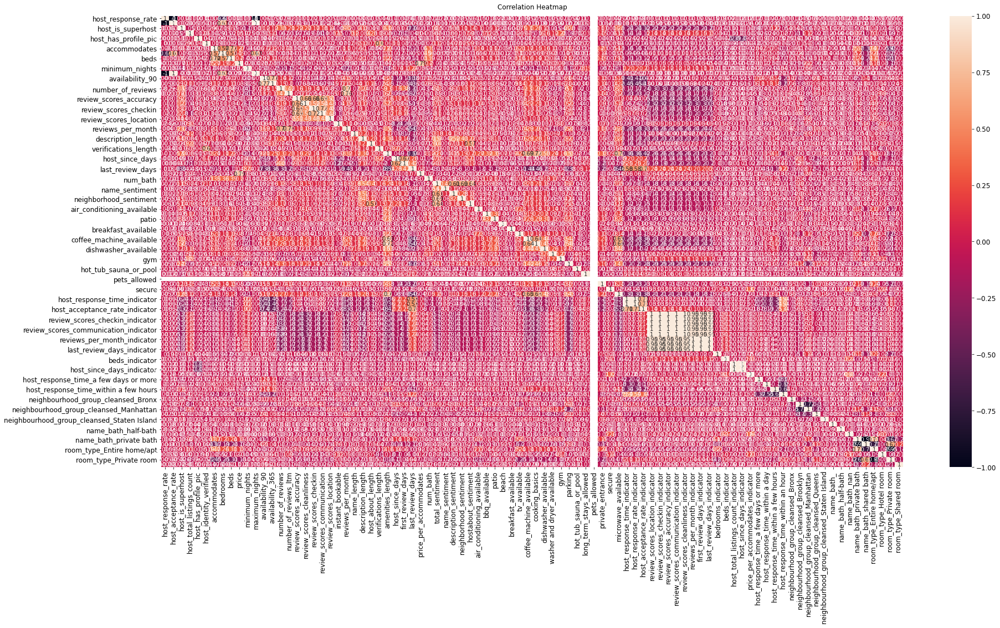

In [351]:
data_corr2 = train_set.corr()
plt.figure(figsize=(30, 15))
heatmap1 = sns.heatmap(data_corr2, vmin=-1, vmax=1, annot=True)
heatmap1.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

Dropping highy correlated variables 

In [352]:
train_set = train_set.drop(columns = ['host_response_rate_indicator','host_since_days_indicator','reviews_per_month_indicator','first_review_days_indicator','reviews_per_month_indicator','review_scores_cleanliness_indicator','review_scores_accuracy_indicator','review_scores_checkin_indicator','review_scores_communication_indicator','review_scores_accuracy_indicator','room_type_Private room','maximum_nights','name_bath_shared bath', 'host_acceptance_rate'])

### Outlier Treatment

In [353]:
from sklearn.ensemble import IsolationForest

iforest = IsolationForest(n_estimators=100, random_state=42, contamination=0.02)
pred = iforest.fit_predict(train_set)
score = iforest.decision_function(train_set)

from numpy import where
anom_index = where(pred== -1)
values = train_set.iloc[anom_index]
values

,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bedrooms,beds,price,minimum_nights,...,neighbourhood_group_cleansed_Manhattan,neighbourhood_group_cleansed_Queens,neighbourhood_group_cleansed_Staten Island,name_bath_,name_bath_half-bath,name_bath_nan,name_bath_private bath,room_type_Entire home/apt,room_type_Hotel room,room_type_Shared room
24551,54.261326,0.0,3.0,1.0,1.0,1.0,1.000000,1.000000,59.0,30.0,...,0,0,0,0,0,0,0,0,0,0
27233,100.000000,0.0,0.0,1.0,1.0,4.0,2.000000,2.000000,200.0,6.0,...,0,0,0,0,0,0,1,1,0,0
29782,62.223284,0.0,0.0,1.0,1.0,4.0,1.543716,1.724124,0.0,30.0,...,0,0,0,0,0,1,0,0,1,0
27115,0.000000,0.0,11.0,1.0,1.0,2.0,1.000000,0.000000,10000.0,30.0,...,1,0,0,0,0,0,0,0,0,0
29495,100.000000,0.0,5.0,1.0,0.0,2.0,1.000000,1.000000,60.0,30.0,...,0,1,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32253,0.000000,0.0,4.0,1.0,0.0,2.0,1.000000,1.021361,150.0,30.0,...,0,0,1,0,0,0,0,0,0,0
35617,100.000000,0.0,1813.0,1.0,1.0,1.0,0.692165,1.000000,193.0,31.0,...,1,0,0,0,0,0,1,1,0,0
23017,59.000000,0.0,11.0,1.0,1.0,2.0,1.000000,1.000000,73.0,1.0,...,1,0,0,0,0,0,1,0,1,0
17235,80.000000,1.0,1.0,1.0,1.0,10.0,3.000000,6.000000,464.0,2.0,...,0,1,0,0,0,0,1,1,0,0


**NOTE: Out of 22208 observations, there are 519 outliers. We will remove the outliers.**

In [354]:
train_set = train_set[~train_set.index.isin(values.index)]
train_set.shape

(25390, 78)

In [355]:
#train_set.columns

### Pre-Process Validation Set

In [356]:
#Flag Missing Values
miss_values = missing_values(valid_set)
cols = miss_values.index
df_try = valid_set[cols].isnull().astype(int).add_suffix('_indicator')

#merge both the df1 and the flagged columns
valid_set = pd.merge(valid_set, df_try, left_index=True, right_index=True)

#Iterative Imputer
df_num = valid_set.drop(columns=['host_response_time', 'neighbourhood_group_cleansed','name_bath', 'room_type'])
imp = IterativeImputer(random_state=0)
df_num1 = imp.fit_transform(df_num)
cols = list(df_num)
df_num1=pd.DataFrame(df_num1)
df_num1.columns=cols
valid_set[cols] = df_num1[cols].values

#categorical encoding
valid_set['host_response_time'] = valid_set['host_response_time'].fillna("within an hour")
valid_set = pd.get_dummies(valid_set, columns=['host_response_time','neighbourhood_group_cleansed','name_bath', 'room_type'])

#drop correlated variables
valid_set = valid_set.drop(columns = ['host_response_rate_indicator','host_since_days_indicator','reviews_per_month_indicator','first_review_days_indicator','reviews_per_month_indicator','review_scores_cleanliness_indicator','review_scores_accuracy_indicator','review_scores_checkin_indicator','review_scores_communication_indicator','review_scores_accuracy_indicator','room_type_Private room','maximum_nights','name_bath_shared bath', 'host_acceptance_rate'])

Dataframe has 60 columns.
There are 16 columns that have missing values.


### Pre-Processing Test Set

In [357]:
#Flag Missing Values
miss_values = missing_values(test_set)
cols = miss_values.index
df_try = test_set[cols].isnull().astype(int).add_suffix('_indicator')

#merge both the df1 and the flagged columns
test_set = pd.merge(test_set, df_try, left_index=True, right_index=True)

#Iterative Imputer
df_num = test_set.drop(columns=['host_response_time', 'neighbourhood_group_cleansed','name_bath', 'room_type'])
imp = IterativeImputer(random_state=0)
df_num1 = imp.fit_transform(df_num)
cols = list(df_num)
df_num1=pd.DataFrame(df_num1)
df_num1.columns=cols
test_set[cols] = df_num1[cols].values

#categorical encoding
test_set['host_response_time'] = test_set['host_response_time'].fillna("within an hour")
test_set = pd.get_dummies(test_set, columns=['host_response_time','neighbourhood_group_cleansed','name_bath', 'room_type'])

#drop correlated variables
test_set = test_set.drop(columns = ['host_response_rate_indicator','host_since_days_indicator','reviews_per_month_indicator','first_review_days_indicator','reviews_per_month_indicator','review_scores_cleanliness_indicator','review_scores_accuracy_indicator','review_scores_checkin_indicator','review_scores_communication_indicator','review_scores_accuracy_indicator','room_type_Private room','maximum_nights','name_bath_shared bath', 'host_acceptance_rate'])


#standardize the data
#sc = StandardScaler()
#X_test_std = sc.transform(X_test)

#drop most useless variables from feature selection
#for i in to_drop:
#     X_test_std= X_test_std.drop(columns = [i])

Dataframe has 60 columns.
There are 16 columns that have missing values.


In [358]:
#X_test.columns

**Separate Predictors and Target Variable**

In [359]:
y_train = train_set['price']
X_train = train_set.drop(columns=['price',  'price_per_accommodates_indicator','price_per_accommodates']) ##taking anything related to price to avoid data leakage

In [360]:
y_valid = valid_set['price']
X_valid= valid_set.drop(columns=['price',  'price_per_accommodates_indicator','price_per_accommodates']) ##taking anything related to price to avoid data leakage

In [361]:
y_test = test_set['price']
X_test = test_set.drop(columns=['price','price_per_accommodates_indicator','price_per_accommodates']) ##taking anything related to price to avoid data leakage

### Standardize Data

In [362]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_std = sc.fit_transform(X_train)
X_valid_std = sc.transform(X_valid)
X_test_std = sc.transform(X_test)

In [363]:
X_valid_std = pd.DataFrame(X_valid_std,columns = X_valid.columns)
X_train_std = pd.DataFrame(X_train_std,columns = X_train.columns)
X_test_std = pd.DataFrame(X_test_std,columns = X_test.columns)

### Feature Selection

**RandomForest Method**

In [113]:
#RandomForest Method
from sklearn.ensemble import RandomForestClassifier
randomforest = RandomForestClassifier(random_state=0)

model = randomforest.fit(X_train_std,y_train)

model.feature_importances_

pd.DataFrame(list(zip(X_train.columns,model.feature_importances_)), columns = ['predictor','feature importance']).sort_values("feature importance")

array([3.25915322e-02, 5.81361138e-03, 2.22814380e-02, 4.67194134e-04,
       7.71807486e-03, 1.77297980e-02, 1.28727610e-02, 1.36151484e-02,
       1.69155074e-02, 2.14565359e-02, 2.50383571e-02, 2.95212414e-02,
       1.46876673e-02, 2.10421962e-02, 2.51582793e-02, 1.90607925e-02,
       1.90785239e-02, 2.15565288e-02, 8.90782830e-03, 4.21017536e-02,
       3.12915351e-02, 4.25807737e-02, 2.85096260e-02, 2.87034987e-02,
       3.84951307e-02, 4.41315220e-02, 4.40256304e-02, 4.36195751e-02,
       9.10000998e-03, 4.30776735e-02, 2.79144422e-02, 4.29808037e-02,
       3.12848958e-02, 2.50840584e-02, 6.29044485e-03, 7.64751004e-03,
       7.05063961e-03, 6.62649490e-03, 5.32600317e-03, 1.00484687e-02,
       5.23952883e-03, 7.99268815e-03, 3.69023236e-03, 6.96084595e-03,
       6.92104805e-03, 4.54728855e-03, 4.45345402e-03, 3.96249406e-03,
       3.77228293e-03, 4.10956104e-03, 9.39214247e-04, 5.71181457e-05,
       1.55258927e-03, 3.56726449e-03, 4.09896174e-03, 5.31914147e-03,
      

,predictor,feature importance
51,host_total_listings_count_indicator,0.000057
61,name_bath_,0.000120
62,name_bath_half-bath,0.000144
63,name_bath_nan,0.000320
3,host_has_profile_pic,0.000467
...,...,...
31,description_sentiment,0.042981
29,total_sentiment,0.043078
27,last_review_days,0.043620
26,first_review_days,0.044026


In [207]:
model_features = pd.DataFrame(list(zip(X_train_std.columns,model.feature_importances_)), columns = ['predictor','feature importance']).sort_values("feature importance")
model_features.tail(20)

,predictor,feature importance
9,availability_90,0.021705
2,host_total_listings_count,0.022270
10,availability_365,0.025041
33,hostabout_sentiment,0.025270
14,review_scores_cleanliness,0.025394
30,name_sentiment,0.027586
22,host_about_length,0.028699
23,verifications_length,0.028962
11,number_of_reviews,0.029815
20,name_length,0.031180


**Recursive Feature Elimination Method**

In [364]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=0)
rfe = RFE(rf, n_features_to_select=50)
model_l = rfe.fit(X_train_std, y_train)

In [365]:
model_l_df = pd.DataFrame(list(zip(X_train_std.columns,model_l.ranking_)), columns = ['predictor','ranking'])
model_l_df

,predictor,ranking
0,host_response_rate,1
1,host_is_superhost,9
2,host_total_listings_count,1
3,host_has_profile_pic,5
4,host_identity_verified,1
...,...,...
70,name_bath_nan,21
71,name_bath_private bath,1
72,room_type_Entire home/apt,1
73,room_type_Hotel room,1


In [366]:
notgood = model_l_df[model_l_df['ranking'] !=1 ]
notgood

,predictor,ranking
1,host_is_superhost,9
3,host_has_profile_pic,5
34,air_conditioning_available,2
35,bbq_available,17
36,patio,6
37,beach,20
40,coffee_machine_available,7
41,cooking_basics,14
47,long_term_stays_allowed,10
48,pets_allowed,26


In [367]:
to_drop = notgood['predictor'].to_list()

In [368]:
#Removing the features that are useless to our model

for i in to_drop:
     X_train_std= X_train_std.drop(columns = [i])

In [369]:
for i in to_drop:
     X_valid_std= X_valid_std.drop(columns = [i])

In [376]:
for i in to_drop:
    X_test_std= X_test_std.drop(columns = [i])

In [375]:
X_valid_std.shape, y_valid.shape, X_train_std.shape, y_train.shape,X_test_std.shape

((6662, 50), (6662,), (25390, 50), (25390,), (4441, 50))

In [380]:
X_train_std.to_csv('X_train.csv', index = False)
X_test_std.to_csv('X_test.csv', index = False)
X_valid_std.to_csv('X_valid.csv', index = False)
y_train.to_csv('y_train.csv', index = False)
y_test.to_csv('y_test.csv', index = False)
y_valid.to_csv('y_valid.csv', index = False)

# 4 - Machine Learning

## A) Unsupervised Learning

### PCA

StandardScaler()

PCA(n_components=2)

<Figure size 576x432 with 0 Axes>

Text(0.5, 0, 'First principal component')

Text(0, 0.5, 'Second Principal Component')

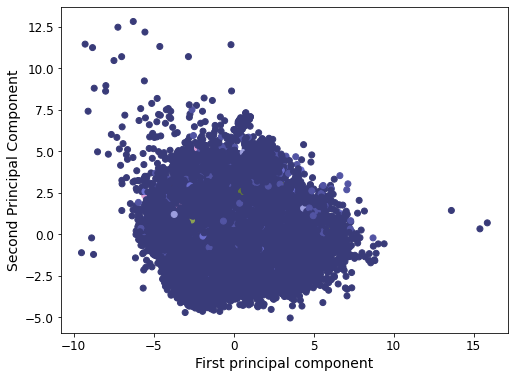

In [124]:
from sklearn.decomposition import PCA
scaler = StandardScaler()
scaler.fit(train_set)
scaled_data = scaler.transform(train_set)
pca = PCA(n_components=2)
pca.fit(scaled_data)
x_pca = pca.transform(scaled_data)
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1],c=train_set['price'],cmap='tab20b')
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

<Figure size 864x432 with 0 Axes>

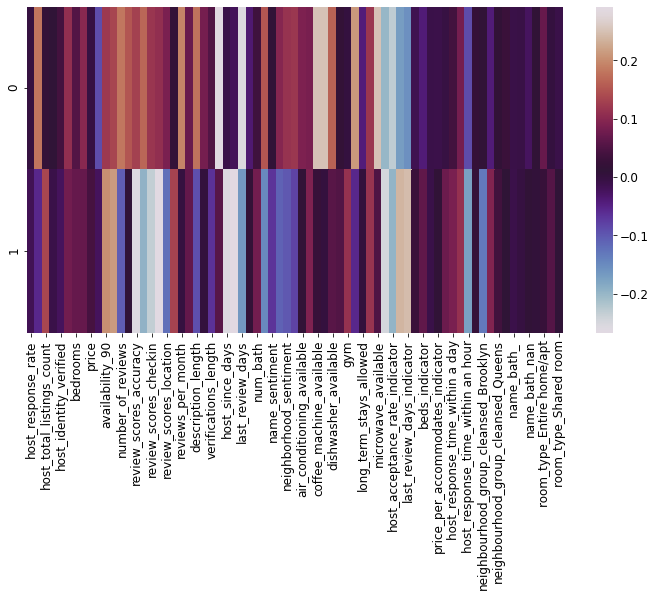

In [125]:
map= pd.DataFrame(pca.components_,columns=train_set.columns)
plt.figure(figsize=(12,6))
sns.heatmap(map,cmap='twilight')

## AUTOENCODER 

In [129]:
from tensorflow import keras
encoder = keras.models.Sequential([
    keras.layers.Dense(3, input_shape=[50]),
])

decoder = keras.models.Sequential([
    keras.layers.Dense(50, input_shape=[3]),
])

autoencoder = keras.models.Sequential([encoder, decoder])
autoencoder.compile(loss='mse', optimizer = keras.optimizers.SGD(lr=0.01))

history = autoencoder.fit(X_train_std,X_train_std, epochs=20,validation_data=(X_valid_std,X_valid_std),
                         callbacks=[keras.callbacks.EarlyStopping(patience=5)])
                         
codings = encoder.predict(X_test_std)

Epoch 1/20
794/794 [==============================] - 2s 2ms/step - loss: 1.0545 - val_loss: 0.9536
Epoch 2/20
794/794 [==============================] - 1s 1ms/step - loss: 0.8769 - val_loss: 0.8703
Epoch 3/20
794/794 [==============================] - 1s 1ms/step - loss: 0.8096 - val_loss: 0.8387
Epoch 4/20
794/794 [==============================] - 1s 1ms/step - loss: 0.7895 - val_loss: 0.8200
Epoch 5/20
794/794 [==============================] - 1s 1ms/step - loss: 0.7854 - val_loss: 0.8062
Epoch 6/20
794/794 [==============================] - 1s 1ms/step - loss: 0.7705 - val_loss: 0.7954
Epoch 7/20
794/794 [==============================] - 1s 1ms/step - loss: 0.8046 - val_loss: 0.7847
Epoch 8/20
794/794 [==============================] - 1s 1ms/step - loss: 0.7407 - val_loss: 0.7775
Epoch 9/20
794/794 [==============================] - 1s 1ms/step - loss: 0.7587 - val_loss: 0.7698
Epoch 10/20
794/794 [==============================] - 1s 1ms/step - loss: 0.8057 - val_loss: 0.7633

In [126]:
#X_test_std

In [127]:
#X_train_std

In [136]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Flatten,Reshape
from tensorflow.keras.optimizers import SGD
 
##Encoder
encoder = Sequential()
encoder.add(Flatten(input_shape=[50]))
encoder.add(Dense(400,activation="relu"))
encoder.add(Dense(200,activation="relu"))
encoder.add(Dense(100,activation="relu"))
encoder.add(Dense(50,activation="relu"))
encoder.add(Dense(2,activation="relu"))
 
### Decoder
decoder = Sequential()
decoder.add(Dense(50,input_shape=[2],activation='relu'))
decoder.add(Dense(100,activation='relu'))
decoder.add(Dense(200,activation='relu'))
decoder.add(Dense(400,activation='relu'))
decoder.add(Dense(50, activation="relu"))
decoder.add(Reshape([50]))
 
### Autoencoder
autoencoder = Sequential([encoder,decoder])
autoencoder.compile(loss="mse", optimizer = keras.optimizers.SGD(lr=0.1))
autoencoder.fit(X_train_std,X_train_std,epochs=10, callbacks=[keras.callbacks.EarlyStopping(patience=5)])
 
encoded_2dim = encoder.predict(X_valid_std)
 
# The 2D
AE = pd.DataFrame(encoded_2dim, columns = ['X1', 'X2'])
 
AE['target'] = y_valid
 
#sns.lmplot(x='X1', y='X2', data=AE, hue='target', fit_reg=False, size=10)

Epoch 1/10
794/794 [==============================] - 3s 3ms/step - loss: 0.9651
Epoch 2/10
794/794 [==============================] - 2s 3ms/step - loss: 0.9416
Epoch 3/10
794/794 [==============================] - 2s 3ms/step - loss: 0.9060
Epoch 4/10
794/794 [==============================] - 2s 3ms/step - loss: 1.0320
Epoch 5/10
794/794 [==============================] - 2s 3ms/step - loss: 0.9952
Epoch 6/10
794/794 [==============================] - 2s 3ms/step - loss: 0.8568
Epoch 7/10
794/794 [==============================] - 2s 3ms/step - loss: 0.8294
Epoch 8/10
794/794 [==============================] - 2s 3ms/step - loss: 0.7993
Epoch 9/10
794/794 [==============================] - 2s 3ms/step - loss: 0.9028
Epoch 10/10
794/794 [==============================] - 3s 4ms/step - loss: 0.8041


<Figure size 720x576 with 0 Axes>

(0.0, 20.0)

<Figure size 720x576 with 0 Axes>

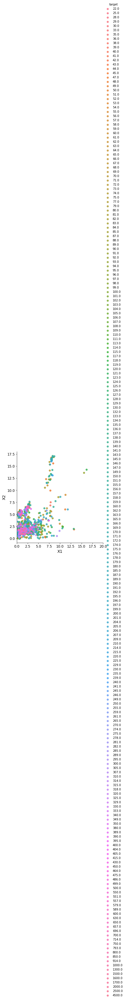

In [137]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10,8))
sns.lmplot(x='X1', y='X2', data=AE, hue='target', fit_reg=False, size=5)
plt.gca().set_xlim(0, 20)

<Figure size 720x576 with 0 Axes>

(0.0, 20.0)

(0.0, 10.0)

<Figure size 720x576 with 0 Axes>

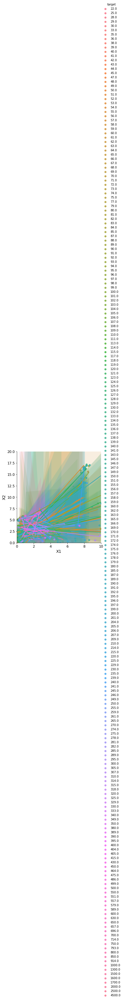

In [138]:
plt.figure(figsize=(10,8))
sns.lmplot(x='X1', y='X2', data=AE, hue='target', fit_reg=True, size=5)
plt.gca().set_ylim(0, 20)
plt.gca().set_xlim(0, 10)

**TSNE**

In [275]:
#from sklearn.manifold import TSNE
#ts = TSNE()
#X_tsne = ts.fit_transform(X_train_std)
#fig, ax = plt.subplots(figsize=(6, 4))
#colors = ["rg"[j] for j in y_train['Price']]
#scat = ax.scatter(
# X_tsne[:, 0],
# X_tsne[:, 1],
# c=colors,
# alpha=0.5,
#)
#ax.set_xlabel("Embedding 1")
#ax.set_ylabel("Embedding 2")

**Unsupervised Training Models are very difficult to interpret**

## C) Supervised Learning

**AutoML**

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) 64-Bit Server VM (build 25.281-b09, mixed mode)
  Starting server from C:\Users\shiva\anaconda3\lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\shiva\AppData\Local\Temp\tmpzxrcxcjf
  JVM stdout: C:\Users\shiva\AppData\Local\Temp\tmpzxrcxcjf\h2o_shiva_started_from_python.out
  JVM stderr: C:\Users\shiva\AppData\Local\Temp\tmpzxrcxcjf\h2o_shiva_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,America/Denver
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.1.1
H2O_cluster_version_age:,23 days
H2O_cluster_name:,H2O_from_python_shiva_8qz3q1
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.499 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"accepting new members, healthy"


<class 'pandas.core.frame.DataFrame'>
Int64Index: 25390 entries, 7263 to 11797
Data columns (total 78 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   host_response_rate                          25390 non-null  float64
 1   host_is_superhost                           25390 non-null  float64
 2   host_total_listings_count                   25390 non-null  float64
 3   host_has_profile_pic                        25390 non-null  float64
 4   host_identity_verified                      25390 non-null  float64
 5   accommodates                                25390 non-null  float64
 6   bedrooms                                    25390 non-null  float64
 7   beds                                        25390 non-null  float64
 8   price                                       25390 non-null  float64
 9   minimum_nights                              25390 non-null  float64
 10  availab

Index(['host_response_rate', 'host_is_superhost', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified', 'accommodates',
       'bedrooms', 'beds', 'price', 'minimum_nights', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'instant_bookable', 'reviews_per_month',
       'name_length', 'description_length', 'host_about_length',
       'verifications_length', 'amenities_length', 'host_since_days',
       'first_review_days', 'last_review_days', 'price_per_accommodates',
       'num_bath', 'total_sentiment', 'name_sentiment',
       'description_sentiment', 'neighborhood_sentiment',
       'hostabout_sentiment', 'air_conditioning_available', 'bbq_available',
       'patio', 'beach', 'breakfast_available', 'tv_available',
       'coffee_machine_available', 'coo

Parse progress: |█████████████████████████████████████████████████████████| 100%


C1,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bedrooms,beds,price,minimum_nights,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,instant_bookable,reviews_per_month,name_length,description_length,host_about_length,verifications_length,amenities_length,host_since_days,first_review_days,last_review_days,price_per_accommodates,num_bath,total_sentiment,name_sentiment,description_sentiment,neighborhood_sentiment,hostabout_sentiment,air_conditioning_available,bbq_available,patio,beach,breakfast_available,tv_available,coffee_machine_available,cooking_basics,dishwasher_available,washer and dryer_available,gym,parking,hot_tub_sauna_or_pool,long_term_stays_allowed,pets_allowed,private_entrance,secure,microwave_available,host_response_time_indicator,host_acceptance_rate_indicator,review_scores_location_indicator,last_review_days_indicator,bedrooms_indicator,beds_indicator,host_total_listings_count_indicator,price_per_accommodates_indicator,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,neighbourhood_group_cleansed_Bronx,neighbourhood_group_cleansed_Brooklyn,neighbourhood_group_cleansed_Manhattan,neighbourhood_group_cleansed_Queens,neighbourhood_group_cleansed_Staten Island,name_bath_,name_bath_half-bath,name_bath_nan,name_bath_private bath,room_type_Entire home/apt,room_type_Hotel room,room_type_Shared room
7263,87,0,51,1,1,4,2,2,165,30,1,1,1,0,10,10,10,10,10,0,0.02,4,53,48,8,9,3351,1471,1471,41.25,1,0.64725,0.7027,0.9169,0,0.9694,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0
33481,94,1,0,1,0,3,1,2,100,1,29,118,32,32,10,10,10,10,10,0,7.62,7,112,1,2,22,3582,125,9,33.3333,1,0.352725,0.4404,0.9705,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0
7823,100,1,2,1,1,2,0.895082,1,103,2,89,89,171,5,10,9,10,10,10,0,2.72,2,38,1,7,26,1915,1887,329,51.5,1,0.426125,0,0.7845,0.92,0,1,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0
31948,91.329,0,0,1,1,2,1.03954,1,150,30,0,0,1,1,10,10,10,10,10,0,0.19,7,74,1,6,16,1717,154,154,75,1,0.232175,0,0.9287,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0
27755,79.5433,0,0,1,1,2,1,1,119,30,0,0,5,0,10,10,10,10,10,1,0.35,3,106,3,6,22,460,424,382,59.5,1,0.4042,0,0.936,0,0.6808,1,0,0,0,0,1,1,1,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
17864,79.459,1,1,1,1,2,1,2,70,15,89,269,18,0,10,10,10,10,10,1,0.51,7,82,6,5,31,2372,1048,483,35,1,0.653125,0.4215,0.9542,0.4404,0.7964,1,0,0,0,1,1,1,1,0,1,0,1,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0
11747,57.0365,0,1,1,0,2,1,1,100,30,0,0,2,0,9,7,10,10,8,1,0.04,8,63,29,8,14,2120,1621,1543,50,1,0.4132,0,0.8402,0,0.8126,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0
19461,63.7496,0,1,1,1,2,1,1,40,5,88,363,6,0,10,10,10,10,10,0,0.19,3,1,43,6,14,940,924,791,20,1,0.289775,0.4588,0,0,0.7003,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0
35087,63,0,1,1,1,2,0.936156,0.822741,86,30,0,0,0,0,8.94066,8.08784,9.27993,9.1278,9.46164,1,0.0773792,5,66,1,8,24,2785,671.957,403.671,43,1,0,0,0,0,0,1,0,0,0,0,1,0,1,1,1,1,0,0,1,0,0,0,1,0,0,1,1,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0
12659,65.7172,0,1,1,1,2,1,1,225,2,90,365,31,0,10,10,10,10,10,0,0.62,6,90,5,6,15,2629,1494,418,112.5,1,0.464025,0.5859,0.8298,0,0.4404,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0


AutoML progress: |
03:28:49.933: AutoML: XGBoost is not available; skipping it.

████████████████████████████████████████████████████████| 100%


model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_AllModels_AutoML_20210418_032849,28719.7,169.469,28719.7,58.0983,nan
StackedEnsemble_BestOfFamily_AutoML_20210418_032849,29444,171.593,29444,59.9559,nan
GBM_2_AutoML_20210418_032849,29742.6,172.46,29742.6,56.8148,nan
GBM_4_AutoML_20210418_032849,29757.4,172.503,29757.4,56.9988,nan
GBM_3_AutoML_20210418_032849,30869,175.696,30869,56.609,nan
GBM_1_AutoML_20210418_032849,32162.6,179.339,32162.6,53.8858,nan
GBM_grid__1_AutoML_20210418_032849_model_1,32711,180.862,32711,56.3963,nan
DRF_1_AutoML_20210418_032849,39727.8,199.318,39727.8,54.8369,0.475057
GBM_5_AutoML_20210418_032849,40498.7,201.243,40498.7,60.4442,nan
XRT_1_AutoML_20210418_032849,41554.5,203.849,41554.5,62.2851,0.540212



Parse progress: |█████████████████████████████████████████████████████████| 100%
stackedensemble prediction progress: |████████████████████████████████████| 100%


predict
220.316
34.2459
255.651
192.988
-4.10874
61.779
23.3325
290.681
228.193
20.6801


['model_id',
 'StackedEnsemble_AllModels_AutoML_20210418_032849',
 'StackedEnsemble_BestOfFamily_AutoML_20210418_032849',
 'GBM_2_AutoML_20210418_032849',
 'GBM_4_AutoML_20210418_032849',
 'GBM_3_AutoML_20210418_032849',
 'GBM_1_AutoML_20210418_032849',
 'GBM_grid__1_AutoML_20210418_032849_model_1',
 'DRF_1_AutoML_20210418_032849',
 'GBM_5_AutoML_20210418_032849',
 'XRT_1_AutoML_20210418_032849',
 'GLM_1_AutoML_20210418_032849',
 'DeepLearning_1_AutoML_20210418_032849']

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_AutoML_20210418_032849,28719.7,169.469,28719.7,58.0983,nan,859,0.058132,StackedEnsemble
StackedEnsemble_BestOfFamily_AutoML_20210418_032849,29444,171.593,29444,59.9559,nan,776,0.037402,StackedEnsemble
GBM_2_AutoML_20210418_032849,29742.6,172.46,29742.6,56.8148,nan,8861,0.020118,GBM
GBM_4_AutoML_20210418_032849,29757.4,172.503,29757.4,56.9988,nan,14407,0.028811,GBM
GBM_3_AutoML_20210418_032849,30869,175.696,30869,56.609,nan,8412,0.014552,GBM
GBM_1_AutoML_20210418_032849,32162.6,179.339,32162.6,53.8858,nan,5551,0.011326,GBM
GBM_grid__1_AutoML_20210418_032849_model_1,32711,180.862,32711,56.3963,nan,6198,0.01225,GBM
DRF_1_AutoML_20210418_032849,39727.8,199.318,39727.8,54.8369,0.475057,21469,0.009367,DRF
GBM_5_AutoML_20210418_032849,40498.7,201.243,40498.7,60.4442,nan,19603,0.029039,GBM
XRT_1_AutoML_20210418_032849,41554.5,203.849,41554.5,62.2851,0.540212,19621,0.01866,DRF


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

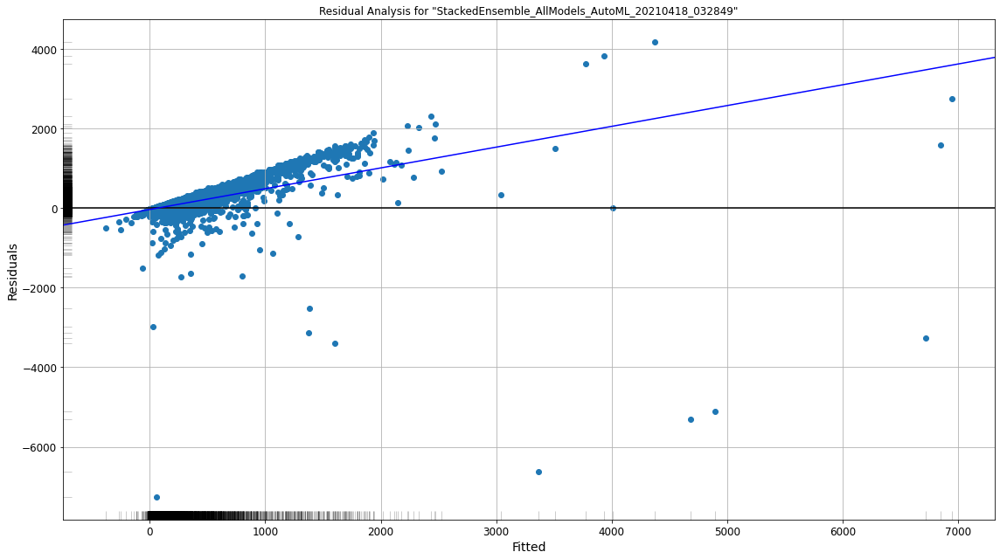

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

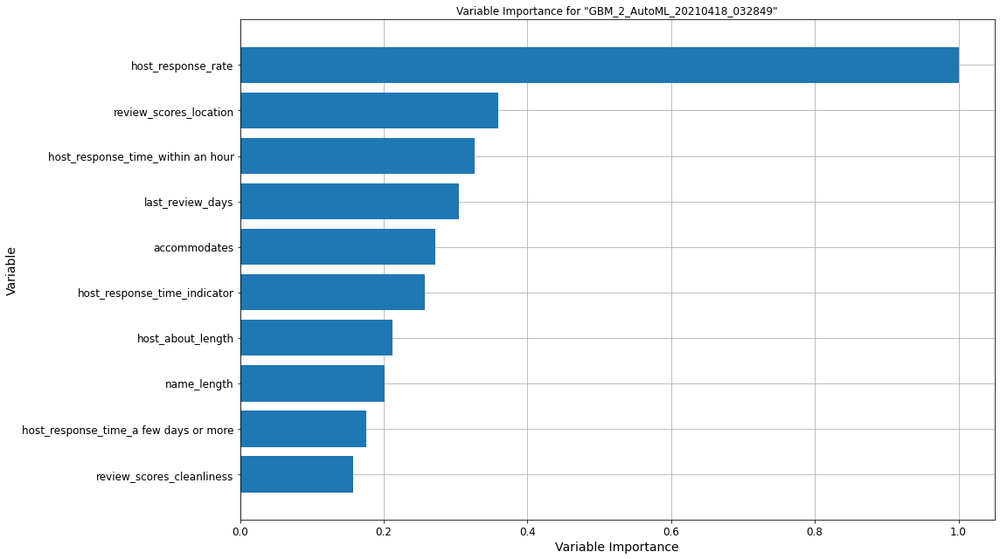

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

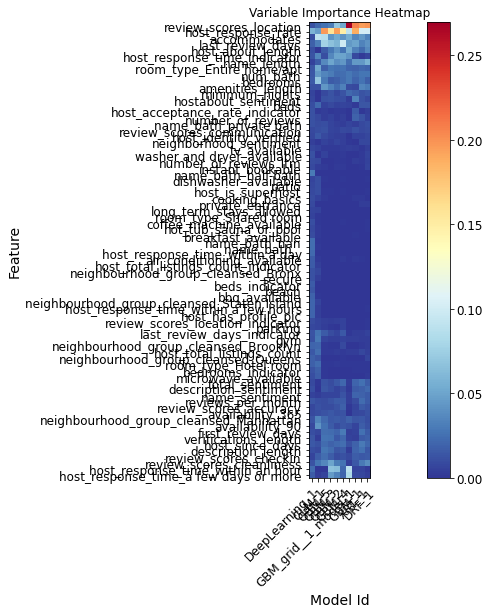

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

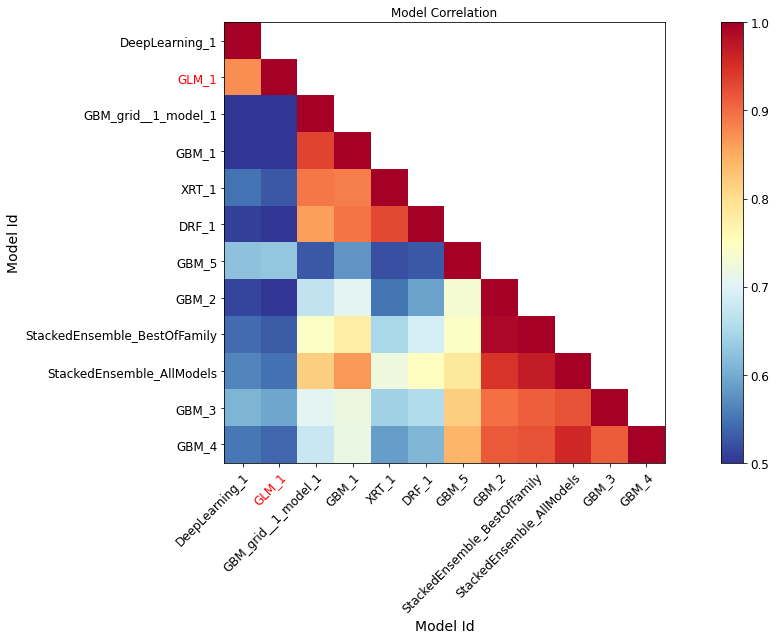

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

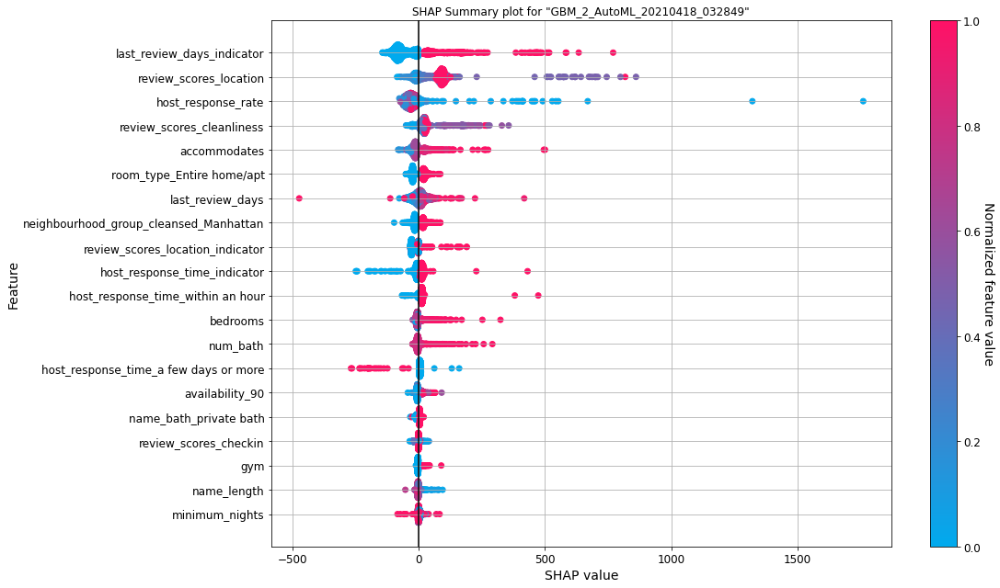

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

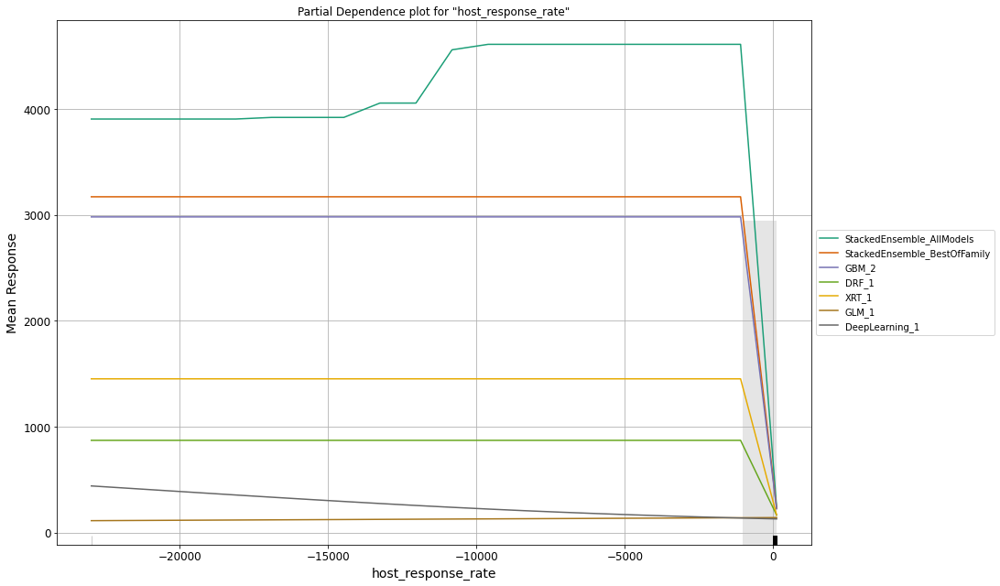

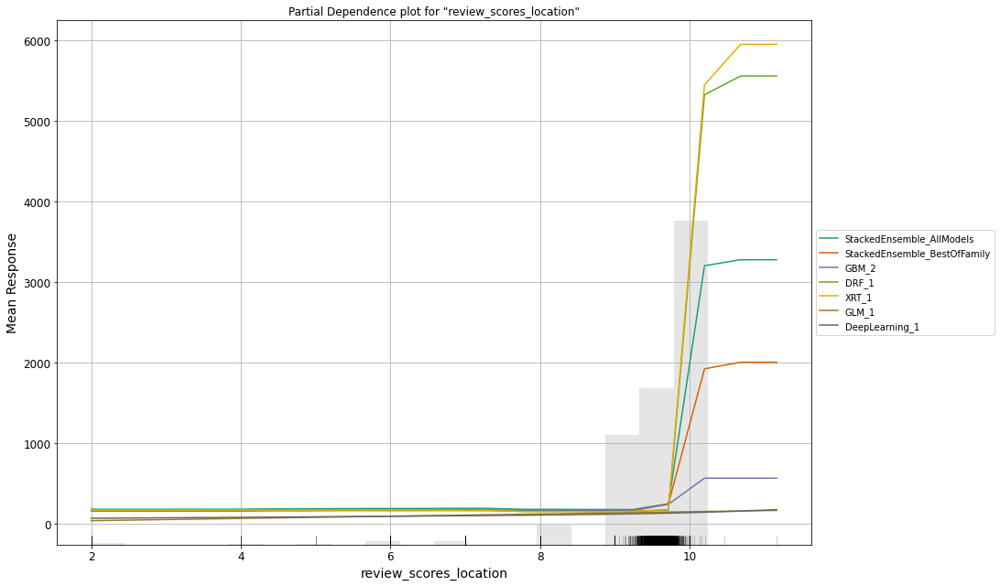

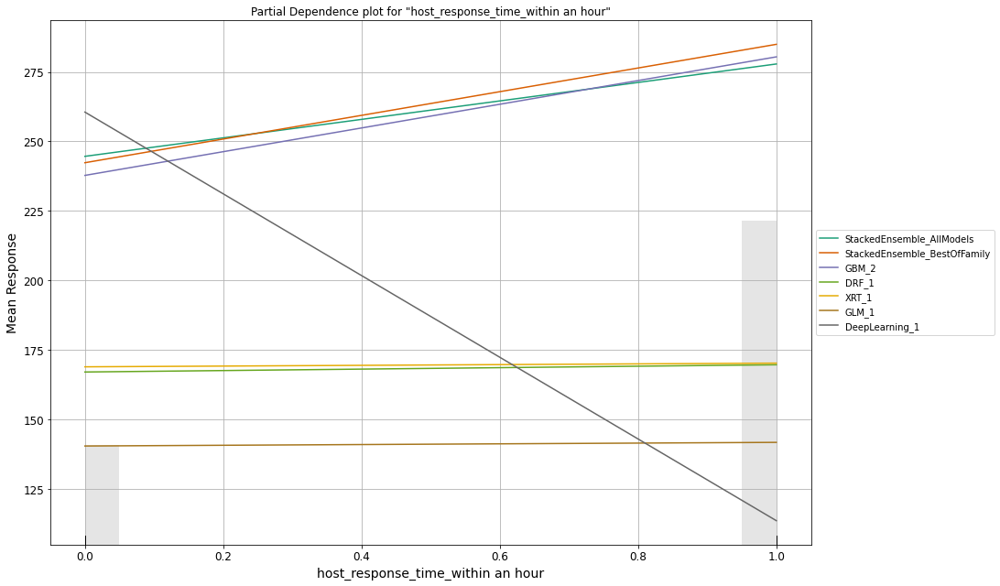

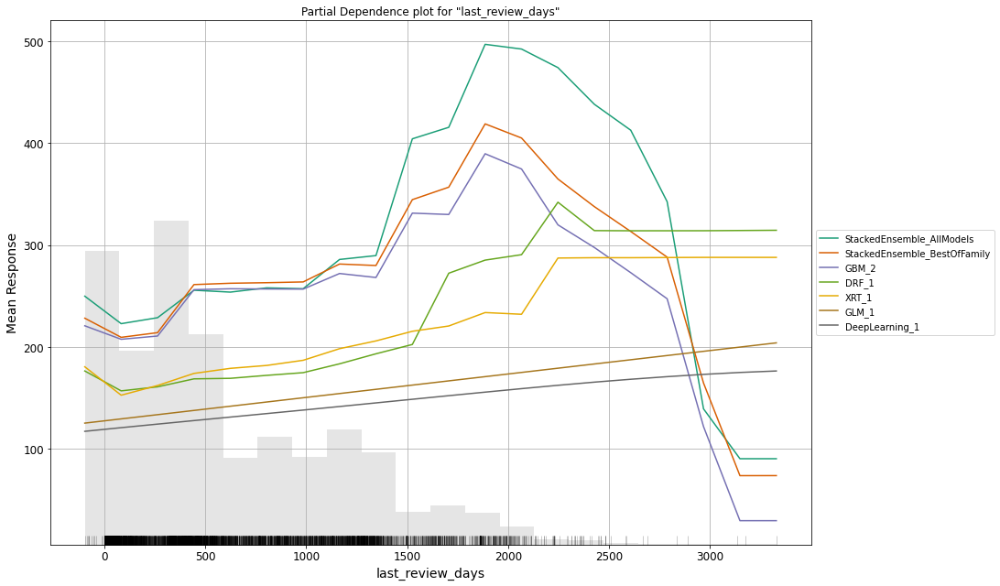

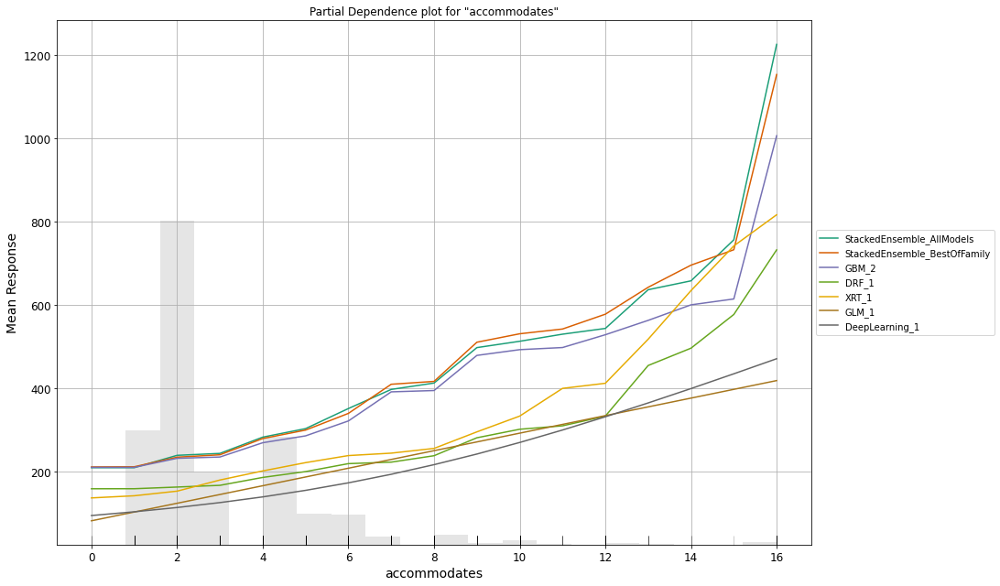

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

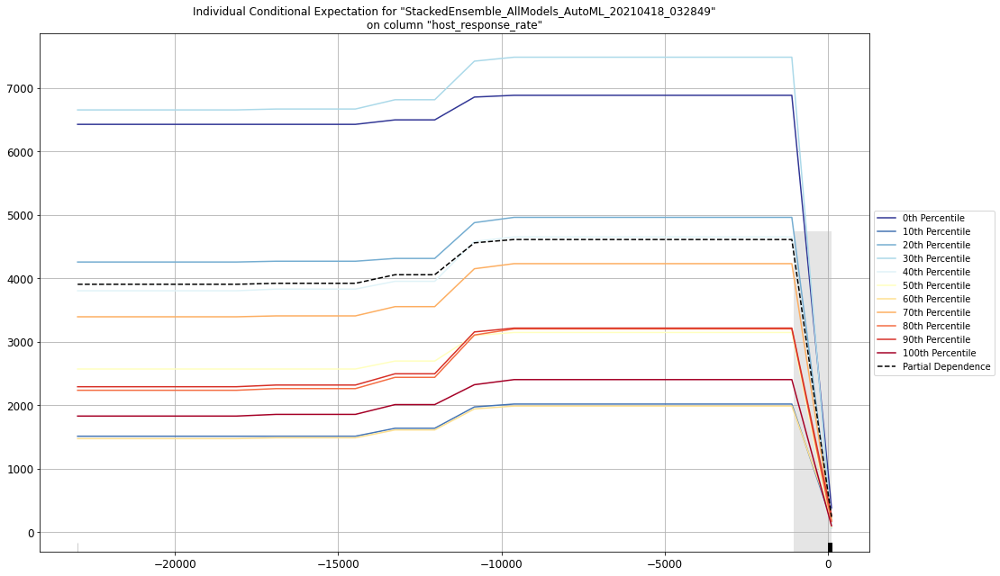

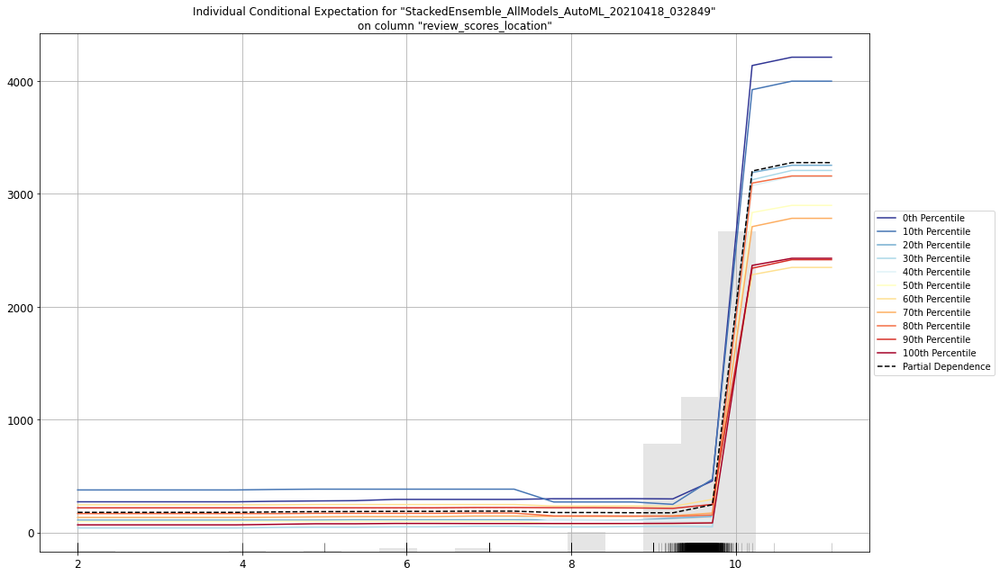

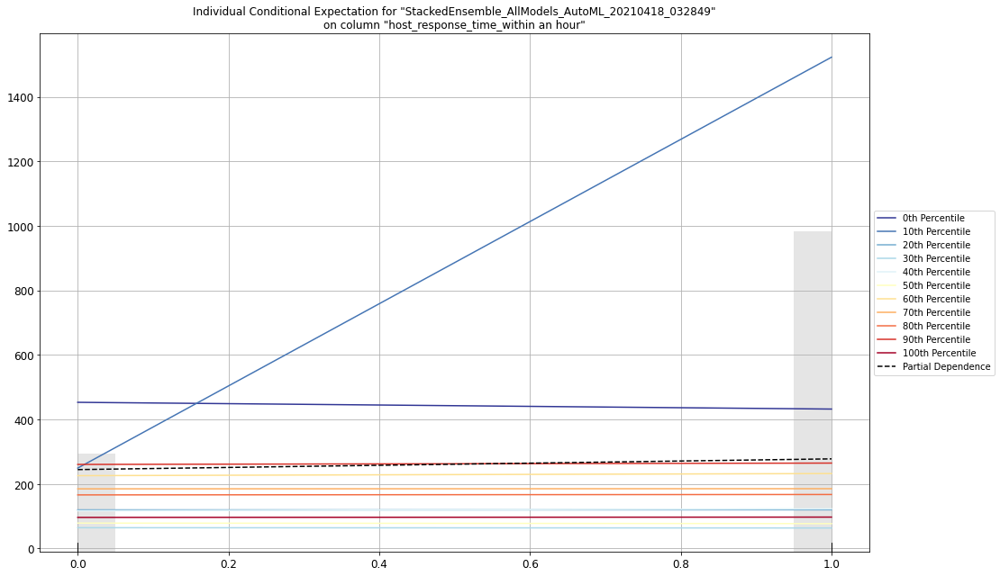

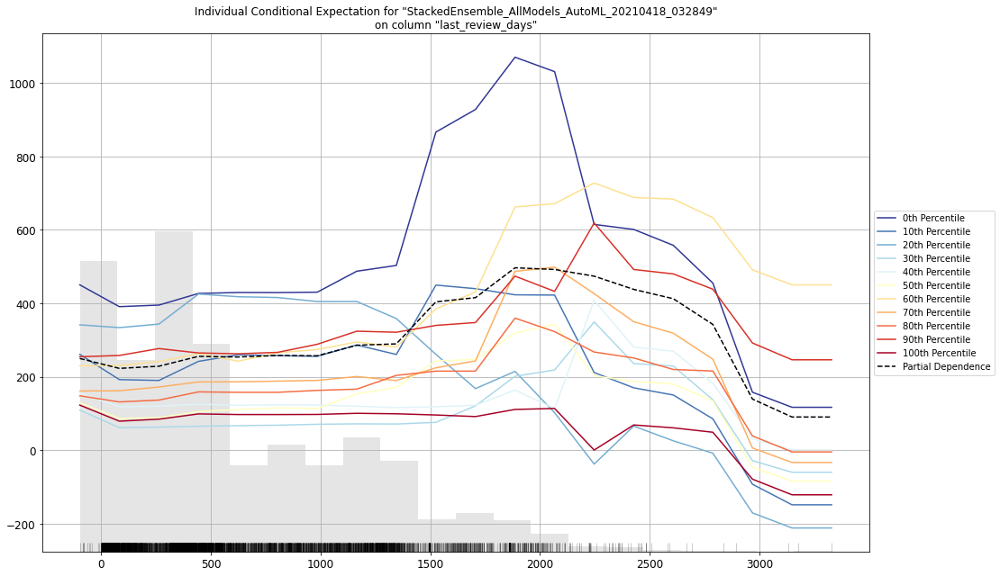

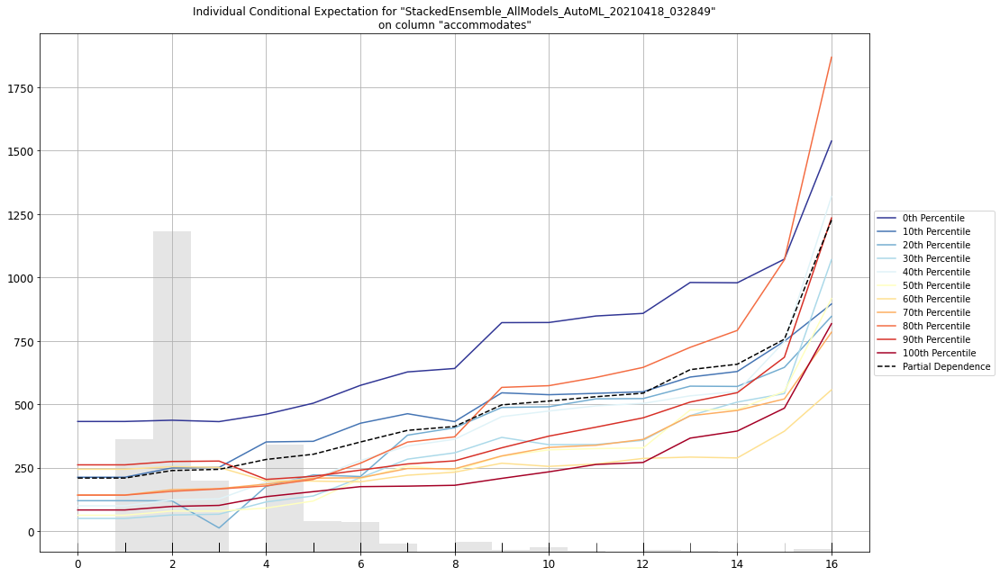

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_AutoML_20210418_032849,28719.7,169.469,28719.7,58.0983,nan,859,0.058132,StackedEnsemble
StackedEnsemble_BestOfFamily_AutoML_20210418_032849,29444,171.593,29444,59.9559,nan,776,0.037402,StackedEnsemble
GBM_2_AutoML_20210418_032849,29742.6,172.46,29742.6,56.8148,nan,8861,0.020118,GBM
GBM_4_AutoML_20210418_032849,29757.4,172.503,29757.4,56.9988,nan,14407,0.028811,GBM
GBM_3_AutoML_20210418_032849,30869,175.696,30869,56.609,nan,8412,0.014552,GBM
GBM_1_AutoML_20210418_032849,32162.6,179.339,32162.6,53.8858,nan,5551,0.011326,GBM
GBM_grid__1_AutoML_20210418_032849_model_1,32711,180.862,32711,56.3963,nan,6198,0.01225,GBM
DRF_1_AutoML_20210418_032849,39727.8,199.318,39727.8,54.8369,0.475057,21469,0.009367,DRF
GBM_5_AutoML_20210418_032849,40498.7,201.243,40498.7,60.4442,nan,19603,0.029039,GBM
XRT_1_AutoML_20210418_032849,41554.5,203.849,41554.5,62.2851,0.540212,19621,0.01866,DRF


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

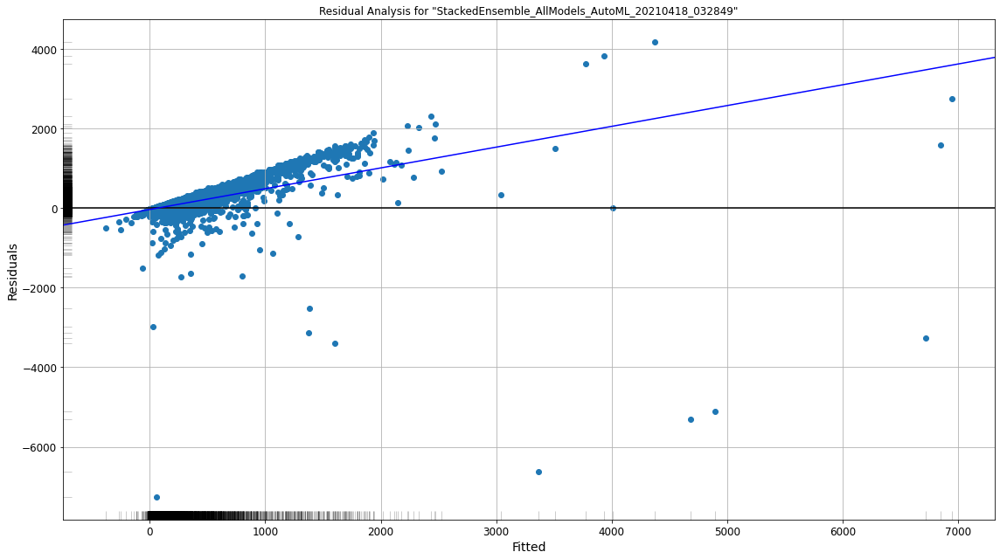

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

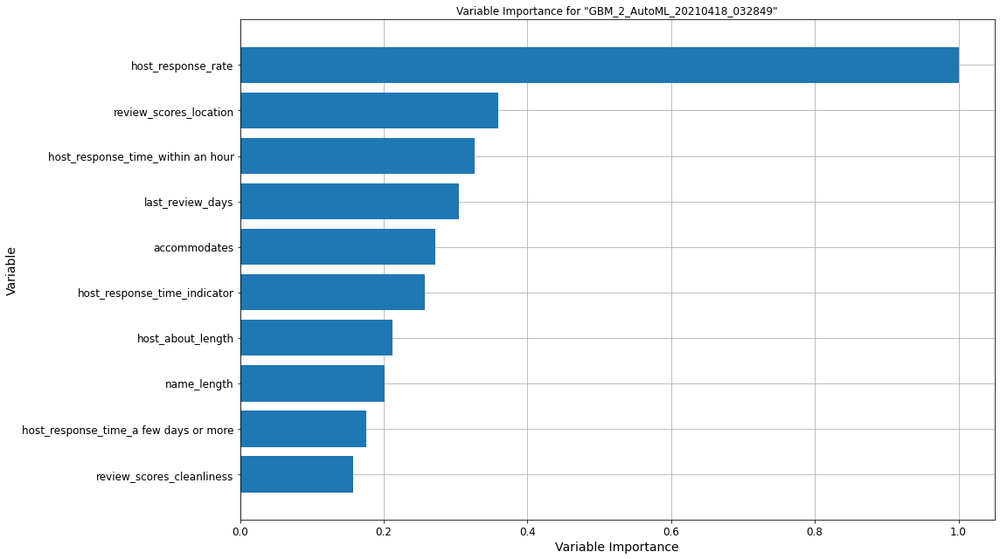

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

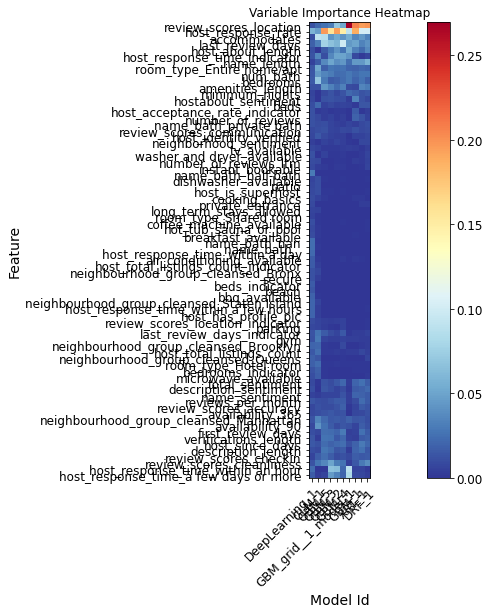

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

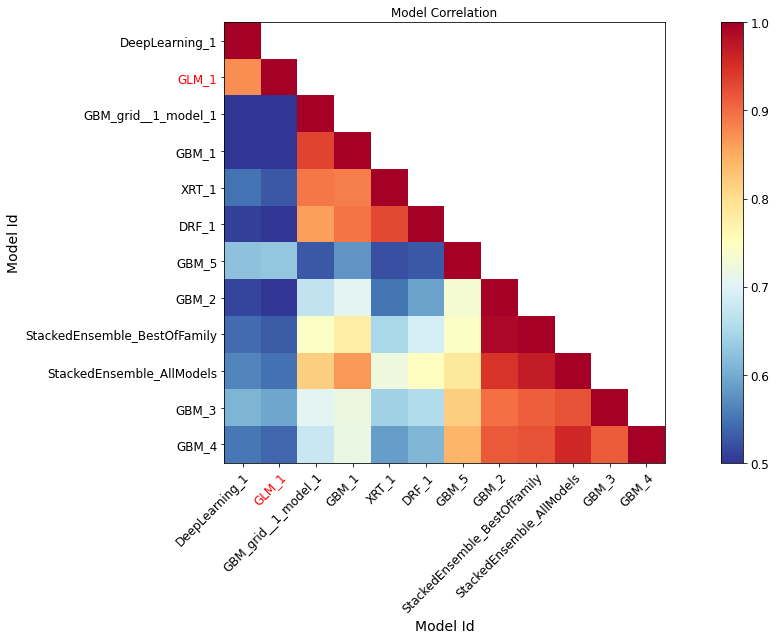

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

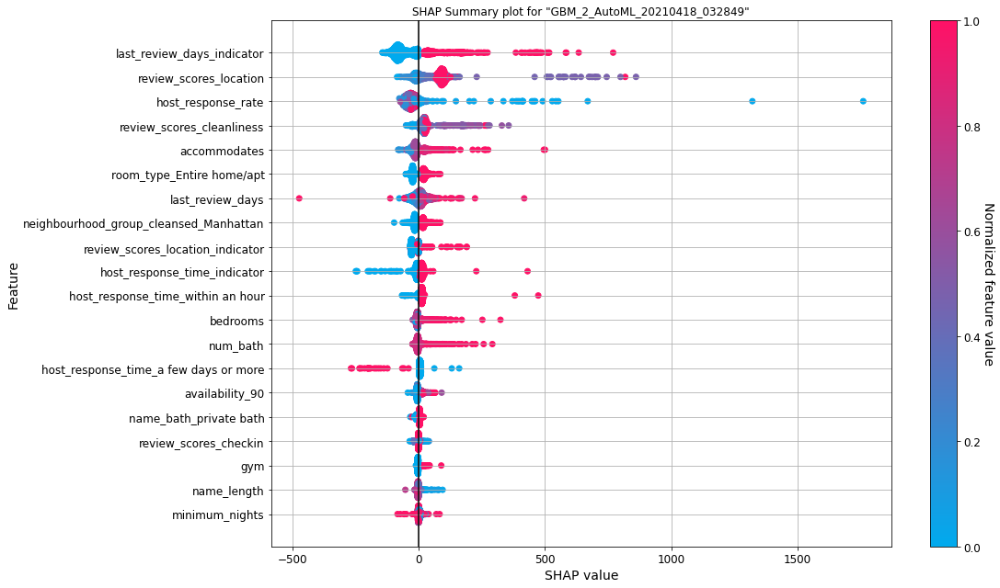

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

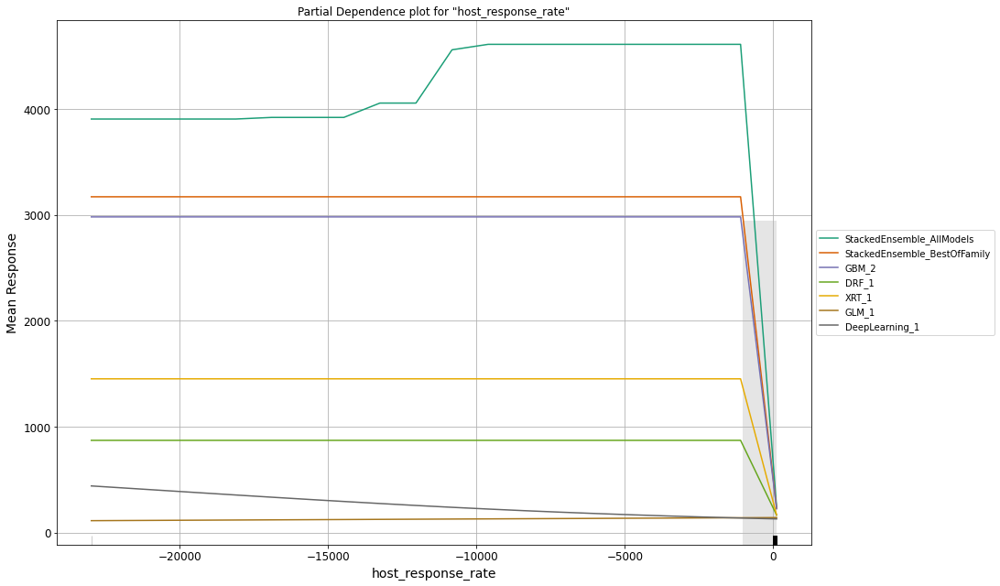

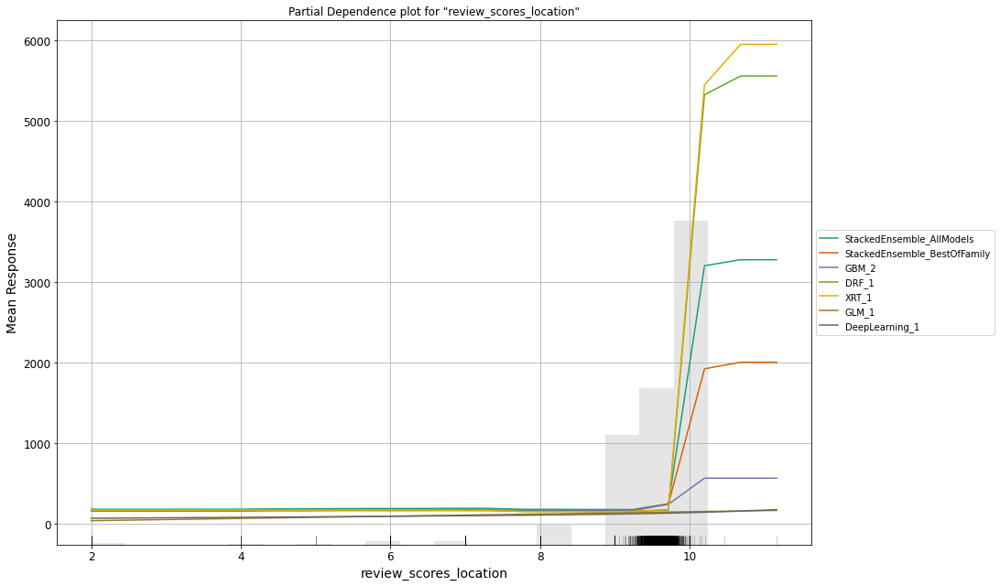

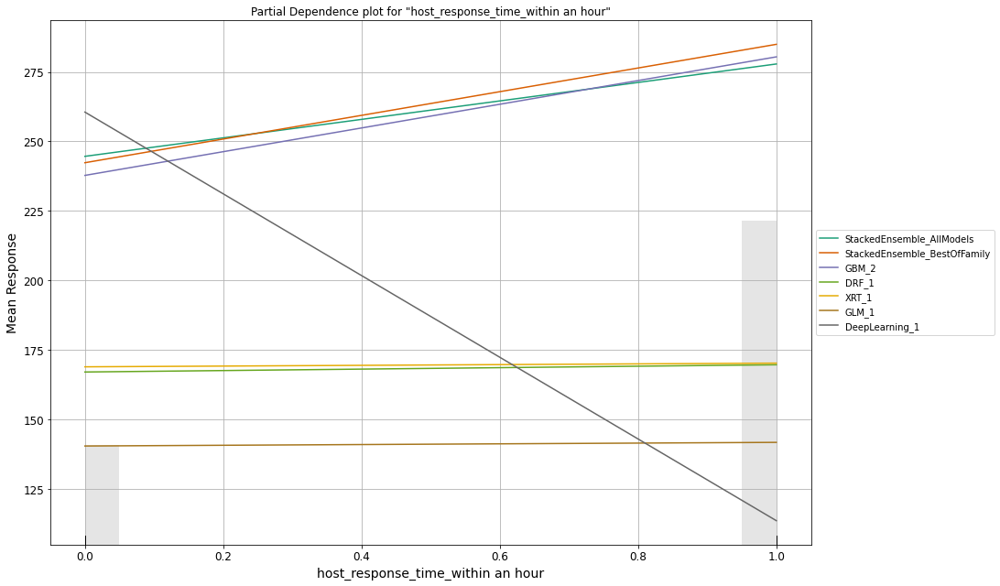

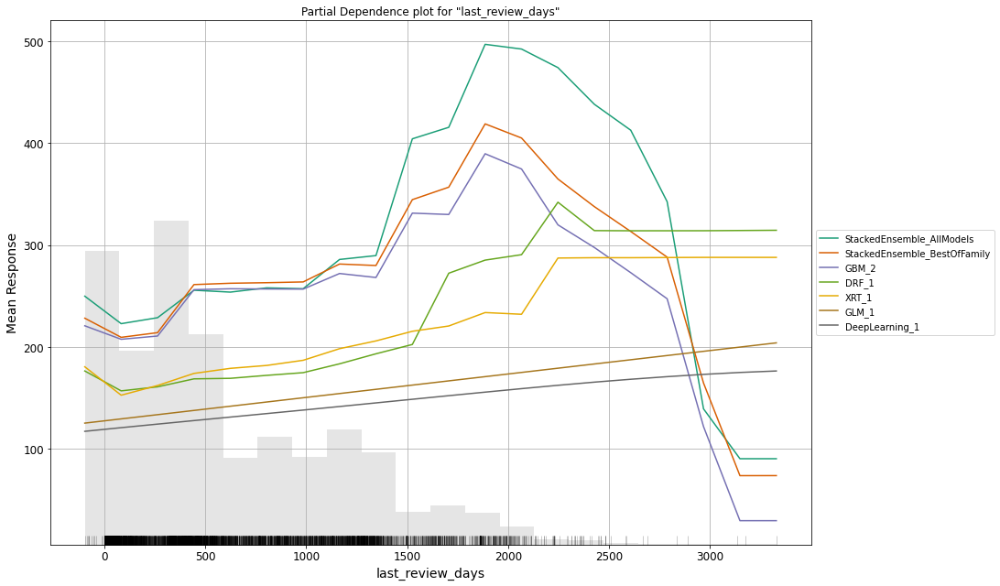

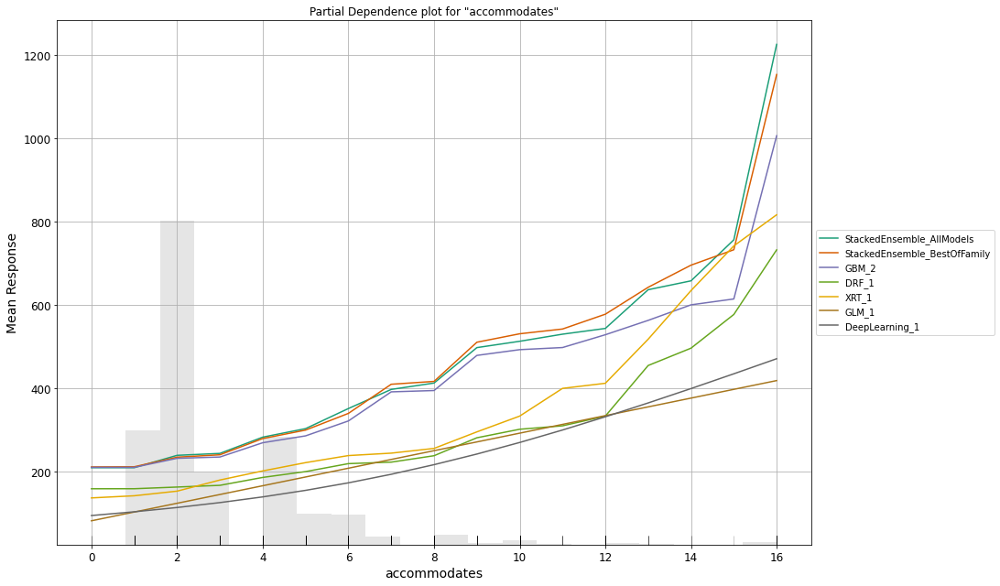

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

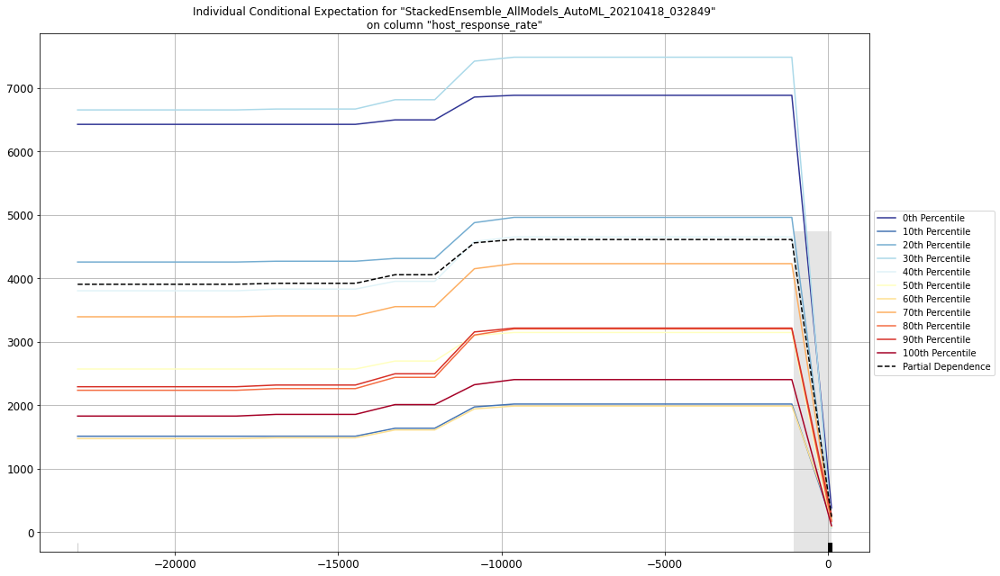

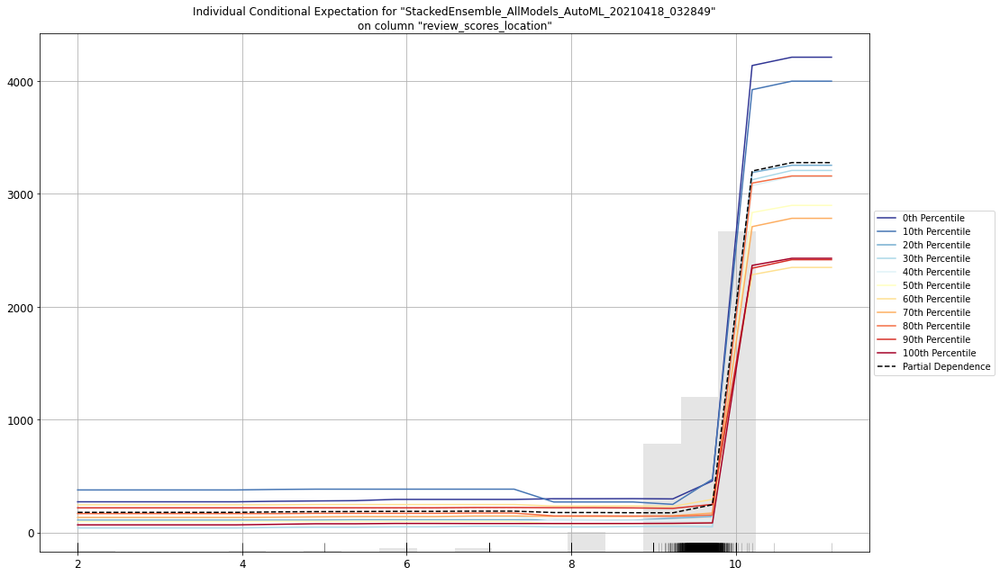

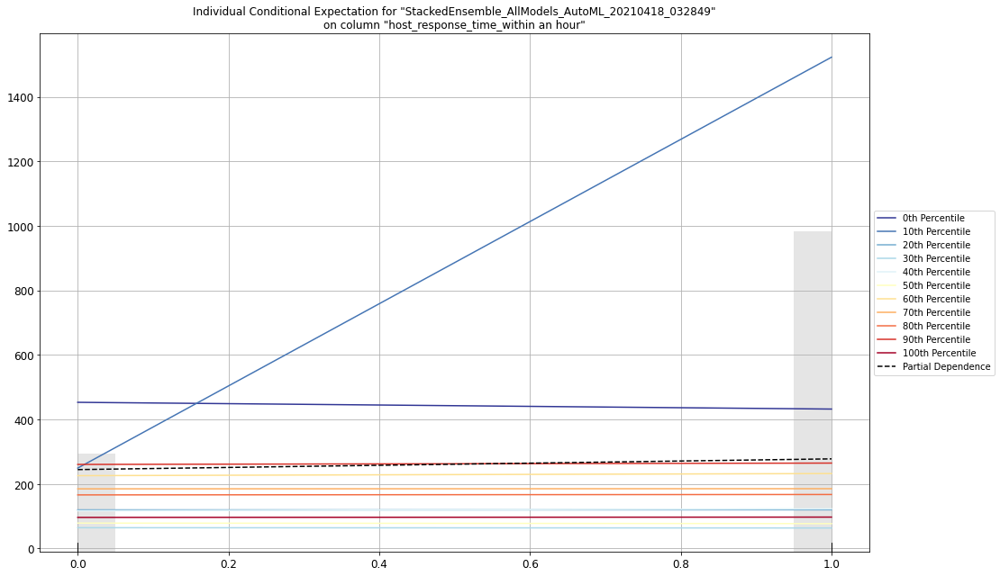

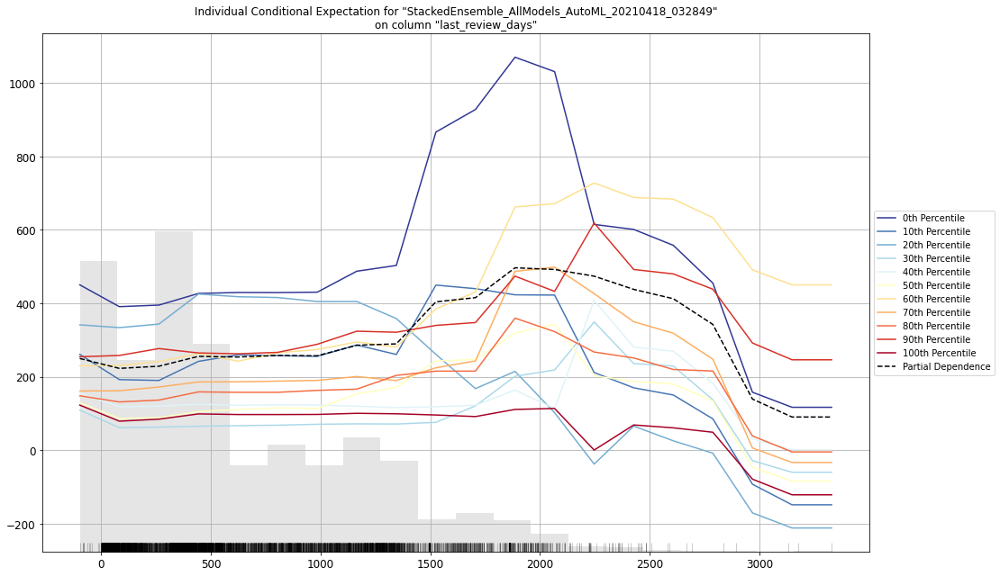

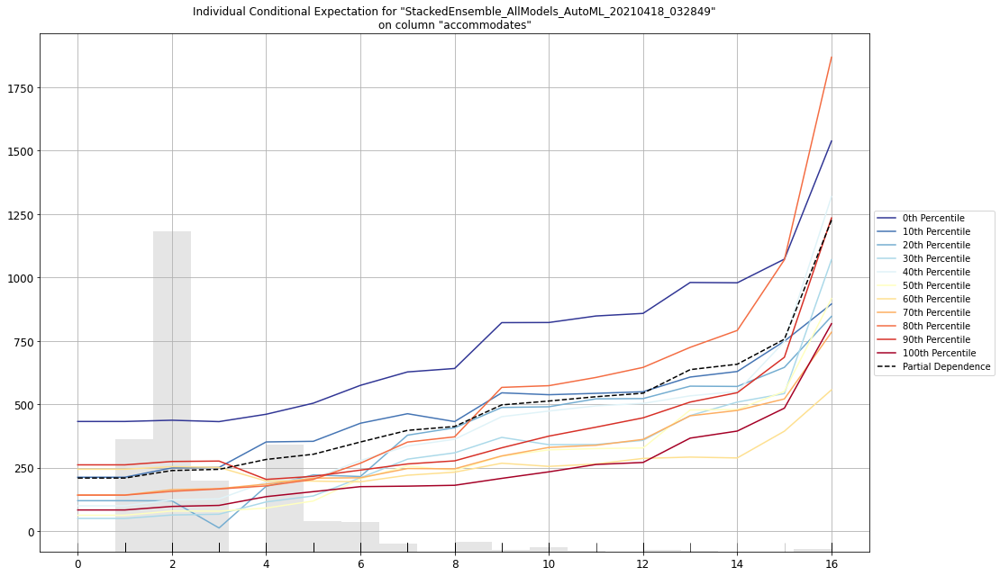

In [382]:
!pip install h2o

import h2o
from h2o.automl import H2OAutoML
# initialize the h2o session
h2o.init()
# load an h2o DataFrame from pandas DataFrame.

train_set.to_csv('automl_train.csv')

train_set.info()

train_set.describe().columns

df_test = h2o.import_file('automl_train.csv')

x = list(train_set.describe().columns)
x.remove('price')
x.remove('price_per_accommodates')
x.remove('price_per_accommodates_indicator')# remove the target
aml = H2OAutoML(max_models=10, seed=1)

df_test

pred=aml.train(x=x, y='price', training_frame=df_test)
lb = aml.leaderboard # Leader board
print(lb.head(rows=lb.nrows)) # print leader board

valid_set.to_csv('for_automl_test.csv')

test = h2o.import_file('for_automl_test.csv')
preds = aml.predict(test)

preds

list_model=h2o.as_list(lb.head(rows=lb.nrows)['model_id'], use_pandas=False)

import itertools

list_m = list(itertools.chain(*list_model))

list_m

#Model Explainability

aml.explain(test)

**INSIGHTS: According to AutoML, a StackedEnsemble Model works best, followed by GBM**

**Now that we have an idea of what model will perform best, we can go ahead with building of the model**

Additionally, we can see that a lot of important features include details regarding host, such as host's response rate, if host's response time is within an hour, the length of host's description about himself etc. Some other key features include review scores for location, the days between last reviews and current date, the number of people that can stay in the property etc. 

## Model Building

## Use Case 1:  For Existing Airbnb Hosts Who Want to Adjust their Prices

**RANDOM FOREST**

In [156]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

rf = RandomForestRegressor(n_estimators=100, random_state=0)
rf.fit(X_train_std, y_train)
pred1 = rf.predict(X_valid_std)
rf_mse = mean_squared_error(y_valid, pred1)
rf_rmse = np.sqrt(rf_mse)
rf_rmse

RandomForestRegressor(random_state=0)

376.6706573816809

**SVR**

In [157]:
from sklearn.svm import SVR

svm_reg = SVR(kernel="linear")
svm_reg.fit(X_train_std, y_train)
predictions = svm_reg.predict(X_valid_std)
svm_mse = mean_squared_error(y_valid, pred1)
svm_rmse = np.sqrt(svm_mse)
svm_rmse

SVR(kernel='linear')

376.6706573816809

**XGBoost**

In [158]:
import xgboost as xgb
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror')
xg_reg.fit(X_train_std, y_train)

preds = xg_reg.predict(X_valid_std)
xgbt_rmse = np.sqrt(mean_squared_error(y_valid, preds))
xgbt_rmse

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

589.1137357907221

**Gradient Boosting Tree**

In [159]:
from sklearn.ensemble import GradientBoostingRegressor


gbt = GradientBoostingRegressor(random_state=0)
model2 = gbt.fit(X_train_std,y_train)
y_test_pred_gbt = model2.predict(X_valid_std)
gbt_rmse = np.sqrt(mean_squared_error(y_valid, y_test_pred_gbt))
gbt_rmse

469.3744954690557

**LGBM**

In [160]:
from lightgbm import LGBMRegressor
# fit the model on the whole dataset
lgbm_reg_model = LGBMRegressor()
lgbm_reg_model.fit(X_train_std, y_train)

#Testing
lgbm_reg_pred = lgbm_reg_model.predict(X_valid_std)
lgbm_reg_mse = mean_squared_error(y_valid, lgbm_reg_pred)
lgbm_reg_rmse = np.sqrt(lgbm_reg_mse)
lgbm_reg_rmse

LGBMRegressor()

372.83537057060084

**Graphing RMSEs**

In [161]:
df = {'Models': ["Random Forest Regressor","Gradient Boosting Regressor", 'XG Boost','LightGBM','SVR'],
     'RMSE': [rf_rmse,gbt_rmse,xgbt_rmse,lgbm_reg_rmse,svm_rmse]
     }

summary = pd.DataFrame(df)

<Figure size 576x432 with 0 Axes>

Text(0.5, 0, 'RMSE')

Text(0, 0.5, 'Models')

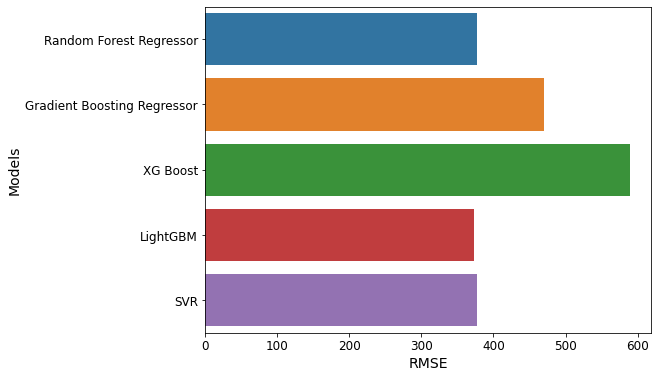

In [162]:
plt.figure(figsize=(8, 6))
splot=sns.barplot(x="RMSE",y="Models",data=summary)
plt.xlabel("RMSE", size=14)
plt.ylabel("Models", size=14)

**THE BEST MODEL IS: *LIGHTGBM***

### Hyperparameter Tuning with MLFlow

In [ ]:
### Hyperparameter Tuning with MLFlow

!pip install mlflow
!pip install hyperopt

In [183]:
import mlflow
import mlflow.pyfunc
import mlflow.sklearn
from sklearn.model_selection import cross_val_score
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
from hyperopt.pyll import scope
from IPython.display import Image
import numpy as np
import lightgbm as lgb
from lightgbm import LGBMModel,LGBMRegressor


hyperparameters = {"max_depth":scope.int(hp.quniform("max_depth",2,100,5)),
                "n_estimators":scope.int(hp.quniform("n_estimators",2,100,1)),
                "num_leaves": scope.int(hp.quniform("num_leaves",2,50,1)),
                "reg_alpha": hp.loguniform('reg_li',-5,5),
                "random_state":1,
                "learning_rate": hp.loguniform("learning_rate", np.log(0.01), np.log(0.5)),
                "min_child_weight": hp.uniform('min_child_weight', 0.5, 10),
                "boosting": hp.choice("boosting",["gbdt","dart","goss"]),
                "objective":"regression"}

def train_model(parameters):
    mlflow.lightgbm.autolog()
    with mlflow.start_run(nested=True):
        booster = lgb.LGBMRegressor()
        booster.set_params(**parameters)
        booster.fit(X_train_std,y_train)
        
        mlflow.log_params(parameters)
        
        score = cross_val_score(booster, X_train_std, y_train, cv=5, scoring = "neg_mean_squared_error",n_jobs=-1)
        mean_score = np.mean(score)
        
        mlflow.log_metric('neg_mean_squared_error', mean_score)
        
        return{'status':STATUS_OK,
               "loss":-1*mean_score,
               'booster':booster.get_params}
    
with mlflow.start_run(run_name='lightgbm_tuning'):
    best_params = fmin(
        fn=train_model,
        space=hyperparameters,
        algo=tpe.suggest,
        max_evals = 5,
        trials = Trials(),
        rstate=np.random.RandomState(1))

[LightGBM] [Warning]                                                                                                   
boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt                                 
100%|███████████████████████████████████████████████████| 5/5 [00:13<00:00,  2.66s/trial, best loss: 40559.80583241278]


In [184]:
best_params

{'boosting': 2,
 'learning_rate': 0.3237856514801242,
 'max_depth': 50.0,
 'min_child_weight': 1.883612256276415,
 'n_estimators': 39.0,
 'num_leaves': 5.0,
 'reg_li': 7.5871037004897}

### Final Model for Use Case 1
**Test Model on Test Set**

In [189]:
lgbm_reg_model = LGBMRegressor(boosting_type='gbdt',
 learning_rate=0.01786582742105907,
 max_depth=50,
 min_child_weight=8.640232244795891,
 n_estimators=39,
 num_leaves=5, n_jobs=-1)
lgbm_reg_model.fit(X_train_std, y_train)

#Testing
lgbm_reg_pred = lgbm_reg_model.predict(X_test_std)
lgbm_reg_mse = mean_squared_error(y_test, lgbm_reg_pred)
lgbm_reg_rmse = np.sqrt(lgbm_reg_mse)
lgbm_reg_rmse

LGBMRegressor(learning_rate=0.01786582742105907, max_depth=50,
              min_child_weight=8.640232244795891, n_estimators=39,
              num_leaves=5)

239.8201474995609

# UI Interface Design

This is a tool where the Airbnb users can input the different predictors, and get an output of the suggested price for their listing

In [ ]:

from sklearn.model_selection import cross_val_score

import numpy as np
import lightgbm as lgb
from lightgbm import LGBMModel,LGBMRegressor
col_list=list(pd.read_csv('X_train.csv').columns)
ui_case1_model = LGBMRegressor(boosting_type='gbdt',
 learning_rate=0.01786582742105907,
 max_depth=50,
 min_child_weight=8.640232244795891,
 n_estimators=39,
 num_leaves=5, n_jobs=-1)
ui_case1_model.fit(X_train[col_list], y_train)


In [ ]:
col_list

In [ ]:
check_list=['host_total_listings_count',
 'host_identity_verified',
 'accommodates',
 'bedrooms',
 'beds',
'number_of_reviews',
'instant_bookable',
 'reviews_per_month',
'name_length',
 'description_length',
 'host_about_length',
 'verifications_length',
 'amenities_length',
 'host_since_days',
 'first_review_days',
 'last_review_days',
'num_bath',
'breakfast_available',
 'tv_available',
 'dishwasher_available',
 'washer and dryer_available',
 'gym',
 'parking']

import gradio as gr

def greet(type_users,host_total_listings_count,host_identity_verified,accommodates,bedrooms,beds,number_of_reviews,instant_bookable,reviews_per_month,name_length,description_length,host_about_length,verifications_length,number_of_amenities_provide,
          host_since_days,first_review_days,last_review_days,num_bath,breakfast_available,tv_available,dishwasher_available,washer_and_dryer_available,gym,parking):
    list_test=[]
    host_identity_verified= 1 if host_identity_verified=='Yes' else 0
    instant_bookable= 1 if instant_bookable=='Yes' else 0
    breakfast_available= 1 if breakfast_available=='Yes' else 0
    tv_available= 1 if tv_available=='Yes' else 0
    dishwasher_available= 1 if dishwasher_available=='Yes' else 0
    washer_and_dryer_available= 1 if washer_and_dryer_available=='Yes' else 0
    gym= 1 if gym=='Yes' else 0
    parking= 1 if parking=='Yes' else 0
    name_length=len(name_length.split())
    description_length=len(description_length.split())
    host_about_length=len(host_about_length.split())
    verifications_length=3
    amenities_length=number_of_amenities_provide
    check=[host_total_listings_count,host_identity_verified,accommodates,bedrooms,beds,number_of_reviews,instant_bookable,reviews_per_month,name_length,description_length,host_about_length,verifications_length,amenities_length,host_since_days,first_review_days,last_review_days,num_bath,breakfast_available,tv_available,dishwasher_available,washer_and_dryer_available,gym,parking]
    for i in col_list:
        if i in check_list:
            list_test.append(check[check_list.index(i)])
        else:
            list_test.append(X_train[i].mode())

    greeting = "Dear {}, Here is our Estimation for the Airbnb price :)".format(type_users)
    price=ui_case1_model.predict([list_test])
    print(price)
    return greeting,str(round(price[0],2))+' USD'

iface = gr.Interface(
  fn=greet, 
  inputs=[gr.inputs.Radio(['New Host','Host','Guest'], label="I am a"),
          
          gr.inputs.Dropdown([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20], label="Total Properties"),
          gr.inputs.Radio(['Yes','No'], label="If Host has a Verified Identity"),
          gr.inputs.Dropdown([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20], label="Accomodates"),gr.inputs.Slider(0, 100),\
          gr.inputs.Slider(0, 100),gr.inputs.Slider(0, 1000),gr.inputs.Radio(['Yes','No'], label="If it's instant bookable"),
          gr.inputs.Slider(0, 100), 'text','text','text','text',gr.inputs.Dropdown([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]),
          gr.inputs.Slider(0, 3000),gr.inputs.Slider(0, 3000),gr.inputs.Slider(0, 1000),
          gr.inputs.Dropdown([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]),
          gr.inputs.Radio(['Yes','No'], label="Provide Breakfast?"),
          gr.inputs.Radio(['Yes','No'], label="Provide TV?"),
          gr.inputs.Radio(['Yes','No'], label="Probide Dishwasher"),
          gr.inputs.Radio(['Yes','No'], label="Probide Laundry"),
          gr.inputs.Radio(['Yes','No'], label="Probide Gym"),
          gr.inputs.Radio(['Yes','No'], label="Probide Parking")],
  outputs=['text',"text"])
iface.launch()

Please refer to the git to see the UI interface. 

<img src="UI_interface_demo.gif" width="800" height="400">

## Use Case 2:  New Airbnb Users Who Want to Know What Price to Set for their New Listing

**Edit the X_train to exclude data that may cause data leakage**

In [218]:
df3.columns

Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_group_cleansed', 'room_type', 'accommodates', 'bedrooms',
       'beds', 'price', 'minimum_nights', 'maximum_nights', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'instant_bookable', 'reviews_per_month',
       'name_length', 'description_length', 'host_about_length',
       'verifications_length', 'amenities_length', 'host_since_days',
       'first_review_days', 'last_review_days', 'price_per_accommodates',
       'num_bath', 'name_bath', 'total_sentiment', 'name_sentiment',
       'description_sentiment', 'neighborhood_sentiment',
       'hostabout_sentiment', 'air_condition

In [219]:
df_new = df3[['host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_group_cleansed', 'room_type', 'accommodates', 'bedrooms',
       'beds', 'price', 'minimum_nights', 'maximum_nights', 'availability_90',
       'availability_365', 'instant_bookable', 
       'name_length', 'description_length', 'host_about_length',
       'verifications_length', 'amenities_length', 'price_per_accommodates',
       'num_bath', 'name_bath', 'air_conditioning_available', 'tv_available',
       'coffee_machine_available', 'cooking_basics', 'dishwasher_available',
       'washer and dryer_available', 'gym', 'parking',
       'long_term_stays_allowed', 'private_entrance', 'microwave_available']]

df_new.head()

,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,room_type,accommodates,bedrooms,beds,price,minimum_nights,...,tv_available,coffee_machine_available,cooking_basics,dishwasher_available,washer and dryer_available,gym,parking,long_term_stays_allowed,private_entrance,microwave_available
0,6.0,1,1,Manhattan,Entire home/apt,2,NaN,1.0,100.0,30,...,1,1,1,0,0,0,1,1,0,0
1,1.0,1,1,Brooklyn,Entire home/apt,3,1.0,3.0,73.0,1,...,1,1,1,0,0,0,1,1,0,1
2,1.0,1,1,Brooklyn,Private room,2,1.0,1.0,60.0,30,...,0,0,0,0,0,0,0,1,0,0
3,1.0,1,0,Manhattan,Private room,2,1.0,1.0,79.0,2,...,1,0,0,0,0,0,1,0,0,1
4,1.0,1,1,Manhattan,Private room,1,1.0,1.0,75.0,2,...,0,0,0,0,0,0,1,0,0,0


In [220]:
train_new_set,valid_new_set=split_train_test(df_new,0.3)
print("The length of train_new set is: ",len(train_new_set))
print("The length of valid_new set is: ",len(valid_new_set))

valid_new_set,test_new_set=split_train_test(valid_new_set,0.4)
print("The length of valid_new set is: ",len(valid_new_set))
print("The length of test_new set is: ",len(test_new_set))

train_new_set.shape, valid_new_set.shape, test_new_set.shape

The length of train_new set is:  25909
The length of valid_new set is:  11103
The length of valid_new set is:  6662
The length of test_new set is:  4441


((25909, 33), (6662, 33), (4441, 33))

**Pre-Process Training Set**

In [221]:
#Flag Missing Values
miss_values = missing_values(train_new_set)
cols = miss_values.index
df_try = train_new_set[cols].isnull().astype(int).add_suffix('_indicator')

#merge both the df1 and the flagged columns
train_new_set = pd.merge(train_new_set, df_try, left_index=True, right_index=True)

#Iterative Imputer
df_num = train_new_set.drop(columns=['neighbourhood_group_cleansed','name_bath', 'room_type'])
imp = IterativeImputer(random_state=0)
df_num1 = imp.fit_transform(df_num)
cols = list(df_num)
df_num1=pd.DataFrame(df_num1)
df_num1.columns=cols
train_new_set[cols] = df_num1[cols].values

#categorical encoding
train_new_set = pd.get_dummies(train_new_set, columns=['neighbourhood_group_cleansed','name_bath', 'room_type'])

Dataframe has 33 columns.
There are 4 columns that have missing values.


availability_90                        availability_365                          0.770611
price                                  price_per_accommodates                    0.761605
accommodates                           beds                                      0.723303
amenities_length                       cooking_basics                            0.714038
name_bath_private bath                 room_type_Entire home/apt                 0.711538
                                                                                   ...   
                                       room_type_Private room                   -0.667333
name_bath_shared bath                  room_type_Entire home/apt                -0.707367
neighbourhood_group_cleansed_Brooklyn  neighbourhood_group_cleansed_Manhattan   -0.718739
room_type_Entire home/apt              room_type_Private room                   -0.947151
name_bath_private bath                 name_bath_shared bath                    -0.988597
Length: 11

<Figure size 2160x1080 with 0 Axes>

Text(0.5, 1.0, 'Correlation Heatmap')

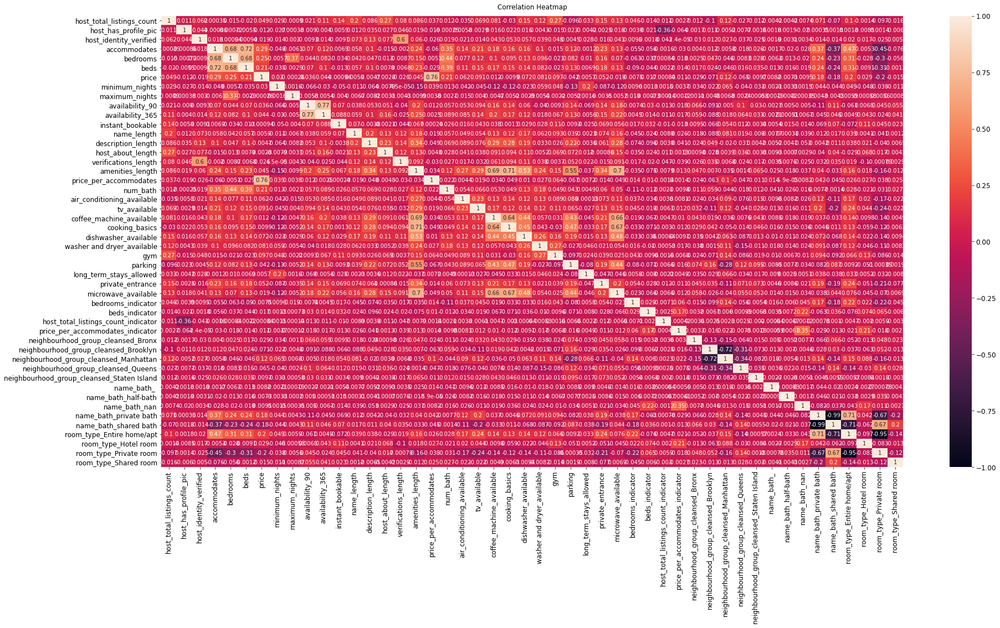

In [222]:
#Correlation

corr_matrix = train_new_set.corr()

mat = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
                  .stack()
                  .sort_values(ascending=False))
mat

data_corr2 = train_new_set.corr()
plt.figure(figsize=(30, 15))
heatmap1 = sns.heatmap(data_corr2, vmin=-1, vmax=1, annot=True)
heatmap1.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

**There are no highly correlated variables**

In [223]:
#Outlier Treatment
from sklearn.ensemble import IsolationForest

iforest = IsolationForest(n_estimators=100, random_state=42, contamination=0.02)
pred = iforest.fit_predict(train_new_set)
score = iforest.decision_function(train_new_set)

from numpy import where
anom_index = where(pred== -1)
values2 = train_new_set.iloc[anom_index]
values2

train_new_set = train_new_set[~train_new_set.index.isin(values.index)]
train_new_set.shape

,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,availability_90,...,neighbourhood_group_cleansed_Staten Island,name_bath_,name_bath_half-bath,name_bath_nan,name_bath_private bath,name_bath_shared bath,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room
22409,3.0,1.0,0.0,1.0,1.000000,1.0,41.0,7.0,100.0,68.0,...,0,0,0,0,0,1,0,0,1,0
35209,2.0,1.0,1.0,1.0,1.000000,1.0,750.0,15.0,15.0,21.0,...,0,0,0,0,0,1,0,0,1,0
15870,0.0,1.0,1.0,2.0,1.000000,1.0,24.0,30.0,90.0,50.0,...,0,0,0,0,0,1,0,0,0,1
460,4.0,1.0,1.0,10.0,3.000000,4.0,164.0,2.0,365.0,67.0,...,1,0,0,0,1,0,1,0,0,0
21645,1337.0,1.0,1.0,2.0,1.017912,1.0,196.0,120.0,1125.0,4.0,...,0,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35673,1337.0,1.0,1.0,2.0,1.000000,1.0,206.0,30.0,1125.0,90.0,...,0,0,0,0,1,0,1,0,0,0
22992,1.0,1.0,0.0,10.0,5.000000,5.0,747.0,2.0,30.0,78.0,...,0,0,0,0,1,0,1,0,0,0
36493,1813.0,1.0,1.0,5.0,2.000000,2.0,318.0,31.0,365.0,67.0,...,0,0,0,0,1,0,1,0,0,0
34977,1337.0,1.0,1.0,2.0,1.000000,1.0,305.0,30.0,1125.0,5.0,...,0,0,0,0,1,0,1,0,0,0


(25553, 48)

In [224]:
#Separate target and predictors 
y_train_new = train_new_set['price']
X_train_new = train_new_set.drop(columns=['price',  'price_per_accommodates_indicator','price_per_accommodates']) ##taking anything related to price to avoid data leakage

In [225]:
#standardize
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_new_std = sc.fit_transform(X_train_new)
X_train_new_std = pd.DataFrame(X_train_new_std,columns = X_train_new.columns)

In [226]:
#feature selection
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=0)
rfe = RFE(rf, n_features_to_select=50)
model_l = rfe.fit(X_train_new_std, y_train_new)

model_l_df2 = pd.DataFrame(list(zip(X_train_new_std.columns,model_l.ranking_)), columns = ['predictor','ranking'])
model_l_df2

notgood2 = model_l_df2[model_l_df2['ranking'] !=1 ]
notgood2

,predictor,ranking
0,host_total_listings_count,1
1,host_has_profile_pic,1
2,host_identity_verified,1
3,accommodates,1
4,bedrooms,1
5,beds,1
6,minimum_nights,1
7,maximum_nights,1
8,availability_90,1
9,availability_365,1


,predictor,ranking


**All features are important!**

**Pre-Process Validation Set**

In [227]:
#Flag Missing Values
miss_values = missing_values(valid_new_set)
cols = miss_values.index
df_try = valid_new_set[cols].isnull().astype(int).add_suffix('_indicator')

#merge both the df1 and the flagged columns
valid_new_set = pd.merge(valid_new_set, df_try, left_index=True, right_index=True)

#Iterative Imputer
df_num = valid_new_set.drop(columns=['neighbourhood_group_cleansed','name_bath', 'room_type'])
imp = IterativeImputer(random_state=0)
df_num1 = imp.fit_transform(df_num)
cols = list(df_num)
df_num1=pd.DataFrame(df_num1)
df_num1.columns=cols
valid_new_set[cols] = df_num1[cols].values

#categorical encoding
valid_new_set = pd.get_dummies(valid_new_set, columns=['neighbourhood_group_cleansed','name_bath', 'room_type'])

#separate target and predictors
y_valid_new = valid_new_set['price']
X_valid_new = valid_new_set.drop(columns=['price',  'price_per_accommodates_indicator','price_per_accommodates']) ##taking anything related to price to avoid data leakage

#standardize
X_valid_new_std = sc.transform(X_valid_new)
X_valid_new_std = pd.DataFrame(X_valid_new_std,columns = X_valid_new.columns)


Dataframe has 33 columns.
There are 4 columns that have missing values.


**Pre-Process Test Set**

In [228]:
#Flag Missing Values
miss_values = missing_values(test_new_set)
cols = miss_values.index
df_try = test_new_set[cols].isnull().astype(int).add_suffix('_indicator')

#merge both the df1 and the flagged columns
test_new_set = pd.merge(test_new_set, df_try, left_index=True, right_index=True)

#Iterative Imputer
df_num = test_new_set.drop(columns=['neighbourhood_group_cleansed','name_bath', 'room_type'])
imp = IterativeImputer(random_state=0)
df_num1 = imp.fit_transform(df_num)
cols = list(df_num)
df_num1=pd.DataFrame(df_num1)
df_num1.columns=cols
test_new_set[cols] = df_num1[cols].values

#categorical encoding
test_new_set = pd.get_dummies(test_new_set, columns=['neighbourhood_group_cleansed','name_bath', 'room_type'])

#separate target and predictors
y_test_new = test_new_set['price']
X_test_new = test_new_set.drop(columns=['price',  'price_per_accommodates_indicator','price_per_accommodates']) ##taking anything related to price to avoid data leakage

#standardize
X_test_new_std = sc.transform(X_test_new)
X_test_new_std = pd.DataFrame(X_test_new_std,columns = X_test_new.columns)


Dataframe has 33 columns.
There are 4 columns that have missing values.


In [229]:
X_valid_new_std.shape, y_valid_new.shape, X_train_new_std.shape, y_train_new.shape

((6662, 45), (6662,), (25553, 45), (25553,))

**TRAIN DIFFERENT MODELS**

RandomForestRegressor(random_state=0)

Random Forest: 236.46187551868417


SVR(kernel='linear')

SVR: 264.6159645567156


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

XGBoost: 233.9611147651391
GBT: 233.0358788617291


LGBMRegressor()

LGBM: 238.73154303747157


<Figure size 576x432 with 0 Axes>

Text(0.5, 0, 'RMSE')

Text(0, 0.5, 'Models')

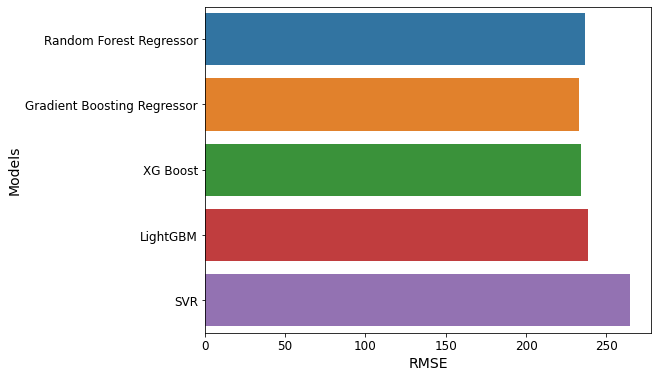

In [231]:
#RandomForest
rf2 = RandomForestRegressor(n_estimators=100, random_state=0)
rf2.fit(X_train_new_std, y_train_new)
pred2 = rf2.predict(X_valid_new_std)
rf_mse2 = mean_squared_error(y_valid_new, pred2)
rf_rmse2 = np.sqrt(rf_mse2)
print("Random Forest:" , rf_rmse2)

#SVR
svm_reg2 = SVR(kernel="linear")
svm_reg2.fit(X_train_new_std, y_train_new)
predictions2 = svm_reg2.predict(X_valid_new_std)
svm_mse2 = mean_squared_error(y_valid_new, predictions2)
svm_rmse2 = np.sqrt(svm_mse2)
print("SVR:" , svm_rmse2)


#XGBoost
xg_reg2 = xgb.XGBRegressor(objective ='reg:squarederror')
xg_reg2.fit(X_train_new_std, y_train_new)

preds2 = xg_reg2.predict(X_valid_new_std)
xgbt_rmse2 = np.sqrt(mean_squared_error(y_valid_new, preds2))
print("XGBoost:" , xgbt_rmse2)

#GradientBoostingTree
gbt2 = GradientBoostingRegressor(random_state=0)
model2 = gbt2.fit(X_train_new_std,y_train_new)
y_test_pred_gbt2 = model2.predict(X_valid_new_std)
gbt_rmse2 = np.sqrt(mean_squared_error(y_valid_new, y_test_pred_gbt2))
print("GBT:" , gbt_rmse2)


#LightGBM
# fit the model on the whole dataset
lgbm_reg_model2 = LGBMRegressor()
lgbm_reg_model2.fit(X_train_new_std, y_train_new)
lgbm_reg_pred2 = lgbm_reg_model2.predict(X_valid_new_std)
lgbm_reg_mse2 = mean_squared_error(y_valid_new, lgbm_reg_pred2)
lgbm_reg_rmse2 = np.sqrt(lgbm_reg_mse2)
print("LGBM:" , lgbm_reg_rmse2)

df2 = {'Models': ["Random Forest Regressor","Gradient Boosting Regressor", 'XG Boost','LightGBM','SVR'],
     'RMSE': [rf_rmse2,gbt_rmse2,xgbt_rmse2,lgbm_reg_rmse2,svm_rmse2]
     }

summary2 = pd.DataFrame(df2)


plt.figure(figsize=(8, 6))
splot=sns.barplot(x="RMSE",y="Models",data=summary2)
plt.xlabel("RMSE", size=14)
plt.ylabel("Models", size=14)

**XGBOOST is the best performing model in Use Case 2**

**HYPERPAREMETER TUNING WITH MLFLOW**

In [274]:
import mlflow.xgboost
import xgboost as xgb
from sklearn.metrics import mean_squared_error

search_space = {"max_depth":scope.int(hp.quniform("max_depth",2,50,5)),
                "n_estimators":scope.int(hp.quniform("n_estimators",50,100,1)),
                #"num_leaves": scope.int(hp.quniform("num_leaves",2,50,1)),
                "reg_alpha": hp.loguniform('reg_li',-5,5),
                "random_state":1,
                "learning_rate": hp.loguniform("learning_rate", np.log(0.01), np.log(0.5)),
                "min_child_weight": hp.uniform('min_child_weight', 0.5, 10),
                #"boosting": hp.choice("boosting",["gbdt","dart","goss"]),
                "objective":"reg:squarederror"
}

def train_model(parameters):
    mlflow.xgboost.autolog()
    with mlflow.start_run(nested=True):
        booster = xgb.XGBRegressor()
        booster.set_params(**parameters)
        booster.fit(X_train_new,y_train_new)
        
        mlflow.log_params(parameters)
        
        score = cross_val_score(booster, X_train_new, y_train_new, cv=5, 
                               scoring = "neg_mean_squared_error",n_jobs=-1)
        mean_score = np.mean(score)
        
        mlflow.log_metric('neg_mean_squared_error', mean_score)
        
        return{'status':STATUS_OK,
               "loss":-1*mean_score,
               'booster':booster.get_params}
    
with mlflow.start_run(run_name='airbnb'):
    best_params = fmin(
        fn=train_model,
        space=search_space,
        algo=tpe.suggest,
        max_evals = 10,
        trials = Trials(),
        rstate=np.random.RandomState(1)
    )

100%|█████████████████████████████████████████████████| 10/10 [06:54<00:00, 41.42s/trial, best loss: 44496.79666451237]


In [276]:
best_params

{'learning_rate': 0.06884784274135033,
 'max_depth': 10.0,
 'min_child_weight': 4.080472823651638,
 'n_estimators': 53.0,
 'reg_li': 7.5871037004897}

**TEST FINAL MODEL ON TEST SET**

In [279]:
xg_reg2 = xgb.XGBRegressor(booster='gbtree', learning_rate= 0.06884784274135033,
 max_depth=10,
 min_child_weight=4.080472823651638,
 n_estimators=53,
 #reg_li=0.07394056191173794
                          )
xg_reg2.fit(X_train_new_std, y_train_new)

preds2 = xg_reg2.predict(X_test_new_std)
xgbt_rmse2 = np.sqrt(mean_squared_error(y_test_new, preds2))
print("XGBoost:" , xgbt_rmse2)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.06884784274135033, max_delta_step=0, max_depth=10,
             min_child_weight=4.080472823651638, missing=nan,
             monotone_constraints='()', n_estimators=53, n_jobs=8,
             num_parallel_tree=1, random_state=0, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

XGBoost: 339.67200474559587


### For this use case, the UI Interface will have a similar input but not include:
- Last reviews days
- host responce rate
- reviews rating

# END.

## ##Extra

### Starbucks Effect

“Starbucks Effect” is the created term to describe the phenomena of how a Starbucks store opening increases home and property values nearby.

In [57]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt

In [58]:
df_airbnb=pd.read_csv(('http://data.insideairbnb.com/united-states/ny/new-york-city/2021-02-04/data/listings.csv.gz'))

In [434]:
df_airbnb['neighbourhood_group_cleansed'].value_counts()
df1.groupby('neighbourhood_group_cleansed')['price_per_accommodates'].mean()

neighbourhood_group_cleansed
Bronx            33.966254
Brooklyn         43.329440
Manhattan        63.230544
Queens           39.402458
Staten Island    32.186507
Name: price_per_accommodates, dtype: float64

In [435]:
df_places = gpd.read_file('new-york.geojson')
df_places['airbnb_num']=[289,4704,14474,16553,992]
df_places['starbucks_num']=[36,50,50,223,50]
df_places['price_per_acc']=[28.97,32.44,39.97,55.44,31.93]

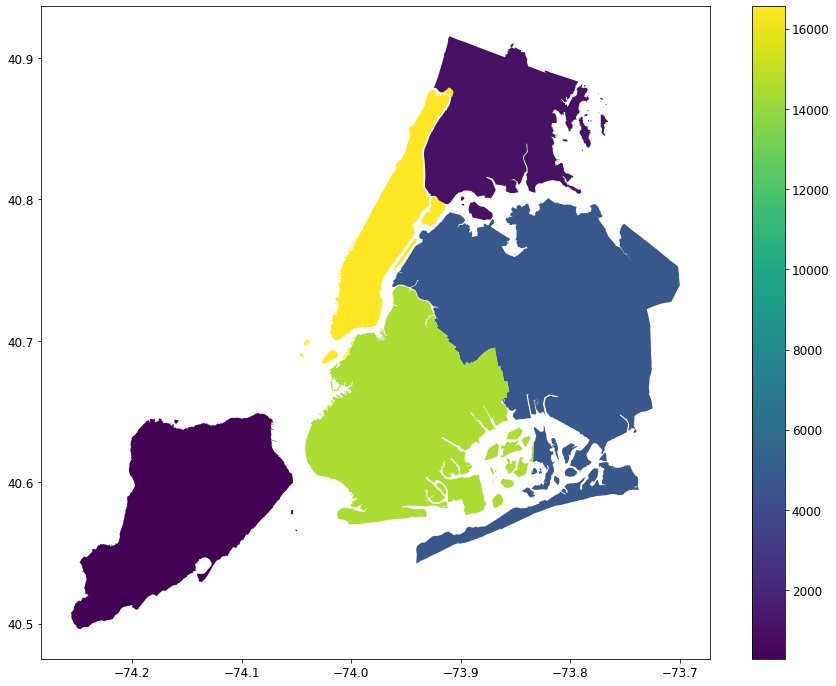

In [436]:
f, ax = plt.subplots(1, figsize=(15, 12))
ax =df_places.plot(column='airbnb_num',ax=ax,legend=True)

plt.show()

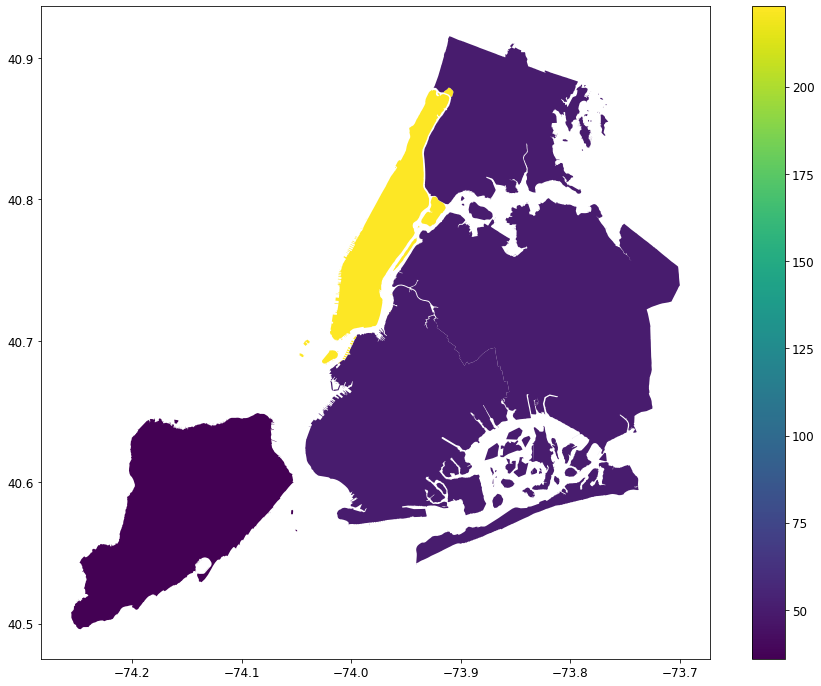

In [437]:
f, ax = plt.subplots(1, figsize=(15, 12))
ax =df_places.plot(column='starbucks_num',ax=ax,legend=True)

plt.show()

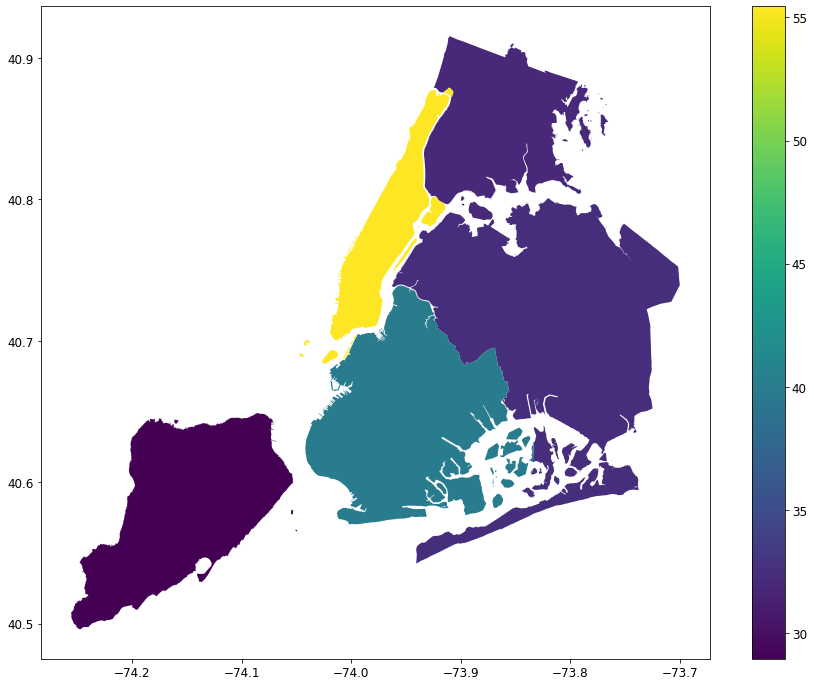

In [438]:
f, ax = plt.subplots(1, figsize=(15, 12))
ax =df_places.plot(column='price_per_acc',ax=ax,legend=True)

plt.show()

It seems like the Starbucks effect **May** be at play here. However, we conducted Causal Analysis using DoWhy to assess if the effect is significant (see CausalML folder in Git repository)

### Semi-Supervised Learning


**PLEASE NORE: this was conducted more for exercise purpose than to get any insights**

In [139]:
import numpy as np
from sklearn import datasets
from sklearn.metrics import confusion_matrix
from sklearn.semi_supervised import LabelSpreading

### To mask data to labeled and unlabeled

In [140]:
import numpy as np
import random

In [149]:
from sklearn.metrics import mean_squared_error
from numpy import concatenate
from sklearn.model_selection import train_test_split
def runLP(x,target,x_test,target_test,n):
        

    data = x
    labels = target

    X_train_lab, X_test_unlab, y_train_lab, y_test_unlab = train_test_split(data, labels, test_size=n, random_state=123)
    #RUN THE MODEL
    X_train_mixed = concatenate((X_train_lab, X_test_unlab))
    # create "no label" for unlabeled data
    nolabel = [-1 for _ in range(len(y_test_unlab))]
    # recombine training dataset labels
    y_train_mixed = concatenate((y_train_lab, nolabel))
    print(y_train_mixed)
    model = LabelSpreading(max_iter=100)
    model.fit(X_train_mixed, y_train_mixed)
    pred = np.array(model.predict(x_test))
    #SEPARATE PREDICTED SAMPLES
    print(model.predict(x).sum())

    
    #PRINT CONFUSION MATRIX
    return model, mean_squared_error(target_test, pred),target_test,pred

In [150]:
#train_set.columns

In [151]:
#train_set.describe().columns

In [152]:
target=train_set['price']
x=train_set[train_set.describe().columns].drop(['price'],axis=1)
x=x.to_numpy()
target_test=test_set['price']
x_test=test_set[test_set.describe().columns].drop(['price'],axis=1)
x_test=x_test.to_numpy()

In [153]:
target_test.to_numpy()

array([ 97.,  39., 205., ..., 150.,  55.,  68.])

In [112]:
pd.DataFrame(pred).describe()

,0
count,25909.000000
mean,0.959937
std,0.280222
min,-1.000000
25%,1.000000
50%,1.000000
75%,1.000000
max,1.000000


In [113]:
train_set.columns

Index(['host_response_rate', 'host_is_superhost', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified', 'accommodates',
       'bedrooms', 'beds', 'price', 'minimum_nights', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'instant_bookable', 'reviews_per_month',
       'name_length', 'description_length', 'host_about_length',
       'verifications_length', 'amenities_length', 'host_since_days',
       'first_review_days', 'last_review_days', 'price_per_accommodates',
       'num_bath', 'total_sentiment', 'name_sentiment',
       'description_sentiment', 'neighborhood_sentiment',
       'hostabout_sentiment', 'air_conditioning_available', 'tv_available',
       'coffee_machine_available', 'cooking_basics', 'dishwasher_available',
       'washer and dryer_av